disclaimer: To ensure that the notebook can be run from (more or less) any point, I try to load the relevant functions or modules whenever I use them in a cell. This is generally not good practice as it adds unneccesary overhead

# 0.  Image representation as numerical arrays
### We start by importing numpy and creating and printing a simple 9x9 checkerboard array


In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload
import numpy as np

#make a 9x9 checkerboard
checkBoard = np.zeros((9,9))
checkBoard[0::2, 1::2] = 1
checkBoard[1::2, 0::2] = 1

print(checkBoard)

[[0. 1. 0. 1. 0. 1. 0. 1. 0.]
 [1. 0. 1. 0. 1. 0. 1. 0. 1.]
 [0. 1. 0. 1. 0. 1. 0. 1. 0.]
 [1. 0. 1. 0. 1. 0. 1. 0. 1.]
 [0. 1. 0. 1. 0. 1. 0. 1. 0.]
 [1. 0. 1. 0. 1. 0. 1. 0. 1.]
 [0. 1. 0. 1. 0. 1. 0. 1. 0.]
 [1. 0. 1. 0. 1. 0. 1. 0. 1.]
 [0. 1. 0. 1. 0. 1. 0. 1. 0.]]


### Then, we import [pyplot](https://matplotlib.org/api/pyplot_api.html) and [image](https://matplotlib.org/api/image_api.html) modules from the ploting library [matplotlib](https://matplotlib.org/3.1.1/api/index.html). Using it, we can display our checkerboard array in image form:

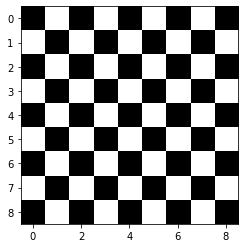

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.imshow(checkBoard, cmap='gray', interpolation='nearest') 
plt.show()

### As another simple example, we will import the [data](https://scikit-image.org/docs/dev/api/skimage.data.html) module image processing library [scikit-image](https://scikit-image.org/) and load a small image of a bush. 

#### First, we want to print the pixel values:

In [3]:
from skimage import data
image_of_a_bush = data.lfw_subset()
image_of_a_bush = image_of_a_bush[0,:,:]

#print the #of dimentions, the shape, and the pixel values of the image
print("The number of dimensions of the image is: ", image_of_a_bush.ndim)
print("The size of the image is: ", image_of_a_bush.shape)
print(image_of_a_bush)

The number of dimensions of the image is:  2
The size of the image is:  (25, 25)
[[0.28888887 0.32941177 0.38039216 0.50326794 0.47973856 0.50457519
  0.55947715 0.54901963 0.56732029 0.57516342 0.59738559 0.61307186
  0.59607846 0.56078434 0.54248363 0.49281046 0.45359477 0.44183007
  0.2522876  0.23529412 0.4261438  0.49673203 0.72418302 0.69934636
  0.43529412]
 [0.29411766 0.33333334 0.44052288 0.52026147 0.49934641 0.53464049
  0.55424833 0.59869283 0.6156863  0.61960787 0.620915   0.63660127
  0.62875813 0.6326797  0.59215689 0.52418303 0.47581699 0.44705883
  0.34640524 0.32287583 0.33202612 0.59738559 0.81830066 0.77777773
  0.27843139]
 [0.35294119 0.41568628 0.42745098 0.48104575 0.50457519 0.52287579
  0.53594774 0.63529414 0.65359479 0.620915   0.61830068 0.64444441
  0.61830068 0.61830068 0.60000002 0.53856206 0.46405229 0.43137255
  0.37254903 0.37908494 0.29411766 0.50065356 0.60915029 0.53856206
  0.36732024]
 [0.41176471 0.43006536 0.49542484 0.48627451 0.50980395 0.52

### Can you see the bush? 

#### Next, show the image:

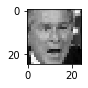

In [4]:
plt.figure(figsize=(1,1))
plt.imshow(image_of_a_bush, cmap='gray', interpolation='nearest') 
plt.show()

# 1. Pixel-level operations 
### Now that we have a sense of what a digital image is, let's start manipulating it. We'll begin with simple pixel-level operations

## 1.1 Basic pixel-level operations
### Let's look at a more interesting image. From scikit-image data we'll open a example IHC image, and plot it using pyplot.

The number of dimensions of the image is:  3
The size of the image is:  (512, 512, 3)


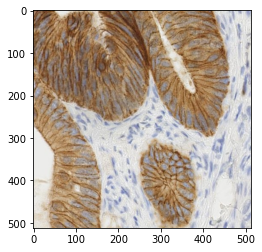

In [5]:
from skimage import data
import matplotlib.pyplot as plt
import numpy as np

image_hist = data.immunohistochemistry()
#check the size of the image
print("The number of dimensions of the image is: ", image_hist.ndim)
print("The size of the image is: ", image_hist.shape)
plt.imshow(image_hist, cmap=plt.cm.gray)

### Seems like we have an RGB image. Let's look at every channel independently.

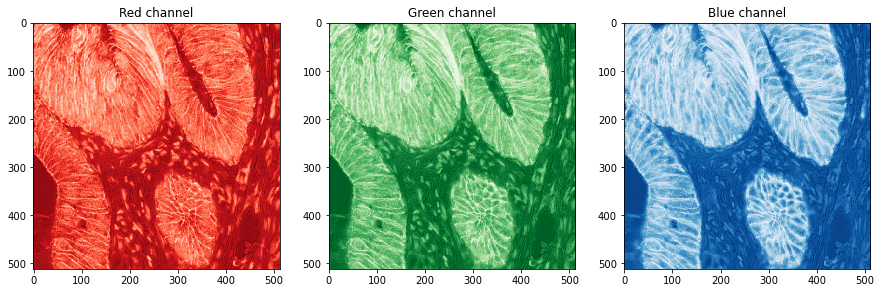

In [6]:
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.gca().set_title('Red channel')
plt.imshow(image_hist[:,:,0], cmap='Reds', interpolation='nearest')
plt.subplot(132)
plt.gca().set_title('Green channel')
plt.imshow(image_hist[:,:,1], cmap='Greens', interpolation='nearest')
plt.subplot(133)
plt.gca().set_title('Blue channel')
plt.imshow(image_hist[:,:,2], cmap='Blues', interpolation='nearest')

plt.show()

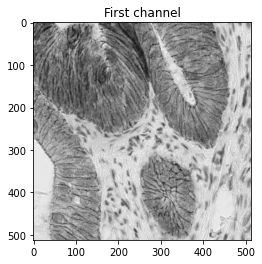

In [7]:
#for the moment let's look at only the first color channel
image_hist = image_hist[:,:,0]
plt.gca().set_title('First channel')
plt.imshow(image_hist, cmap=plt.cm.gray)


### We can invert the image using the *invert* function from [scikit-images utilities module](https://scikit-image.org/docs/dev/api/skimage.util.html):

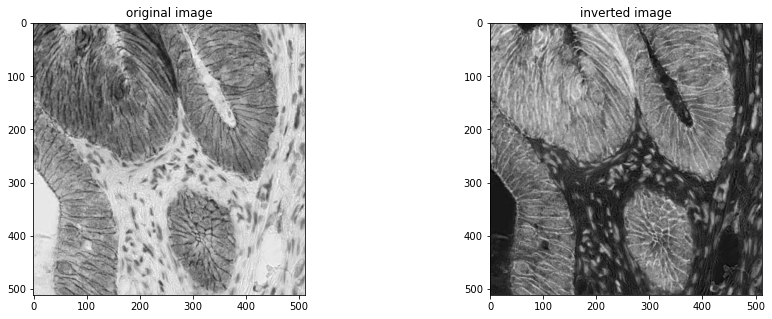

In [8]:
from skimage.util import invert

inverted_image = invert(image_hist)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.gca().set_title('original image')
plt.imshow(image_hist, cmap=plt.cm.gray)
plt.subplot(122)
plt.gca().set_title('inverted image')
plt.imshow(inverted_image, cmap=plt.cm.gray)


### Let's try some other pixel-level operations. We'll use the [Exposure module](https://scikit-image.org/docs/dev/api/skimage.exposure.html#skimage.exposure.adjust_sigmoid) from scikit image.

1. A gamma correction applies the nonlinear transform $V_{out} = V_{in}^\gamma$.

2. A log transform applies $V_{out} = log(V_{in}+1)$.

3. A sigmoid transform applies $V_{out} = \frac{1}{1+e^{gain\cdot(\text{cutoff}-V_{in})}}$.

4. Equalization transforms the intensity histogram of an image to a uniform distribution. It often enhances the contrast of the image

5. CLAHE works similarly to equalization thats applied separately to different regions of the image.

Try to apply these by calling the relevant function from skimage.exposure, or by direct calculation. 

Play with the different parameters and see how they change the output.

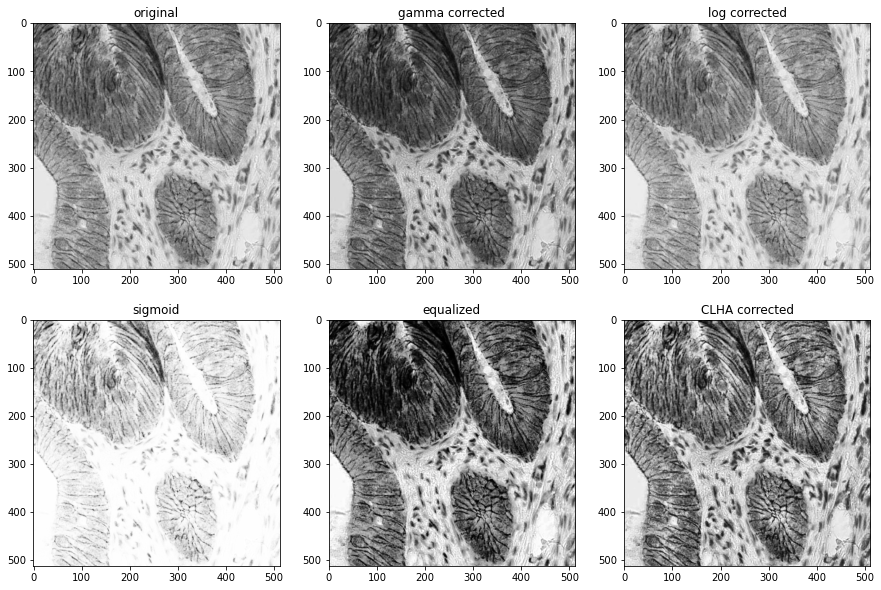

In [9]:
from skimage import exposure

# apply gamma scaling with gamma=2
gamma=2
gamma_corrected = exposure.adjust_gamma(image_hist, gamma)

# apply logarithmic scaling
logarithmic_corrected = exposure.adjust_log(image_hist)

# apply sigmoidal scaling with cutoff=0.4
cutoff = 0.4
sigmoid_corrected = exposure.adjust_sigmoid(image_hist, cutoff=cutoff)

# equalize
equalize_corrected = exposure.equalize_hist(image_hist)

# apply Contrast Limited Adaptive Histogram Equalization (CLAHE)
CLHA_corrected = exposure.equalize_adapthist(image_hist)

plt.figure(figsize=(15,10))

plt.subplot(231)
plt.gca().set_title('original')
plt.imshow(image_hist, cmap=plt.cm.gray)

plt.subplot(232)
plt.gca().set_title('gamma corrected')
plt.imshow(gamma_corrected, cmap=plt.cm.gray)

plt.subplot(233)
plt.gca().set_title('log corrected')
plt.imshow(logarithmic_corrected, cmap=plt.cm.gray)

plt.subplot(234)
plt.gca().set_title('sigmoid')
plt.imshow(sigmoid_corrected, cmap=plt.cm.gray)

plt.subplot(235)
plt.gca().set_title('equalized')
plt.imshow(equalize_corrected, cmap=plt.cm.gray)

plt.subplot(236)
plt.gca().set_title('CLHA corrected')
plt.imshow(CLHA_corrected, cmap=plt.cm.gray)

## 1.2 Image filtering

### Spatial filtering is an image processing technique for changing the intensities of a pixel according to the intensities of some neighborhood of pixels. 
<img src="./images/same_padding_no_strides.gif" width="400" height="200" >


### The *Kernel* of the filter defines the neighborhood and the weights asigned to each pixel in the neighborhood:

<img src="./images/spatialFilter.jpg" width="400" height="200" >
This procedure is formally a convolution and is marked by an asterisk: $I_o = I_i\ast f$. 

*side note: since a convolution in the spatial domain is equivalent to multiplication in the frequency domain. Sometimes it is more computationally reasonable to calculate these in fourier space.*

*side side note: filtering can also be performed in the frequency domain by directly removing a set of frequencies from an image.*


### The kernel can be of any shape/size, it is applied to each pixel in the image, and the output is a new, filtered, image. The output image is often called the *response* to the given filter.
Example, local average: <img src="./images/spatialFilterExample.jpg" width="300" height="150">


#### Filtering is an incredibly versatile tool with which you can emphasize certain features or remove other features. 
#### Image processing operations implemented with filtering include smoothing, sharpening, and edge enhancement.


### To implement different image filters, we will use the [filters module from scikit-image](https://scikit-image.org/docs/dev/api/skimage.filters.html)

### 1.2.1 Smoothing

#### Smoothing, aka low-pass filtering, is used for removing high-frequency noise from images. Most commonly, a gaussian kernel is used, but others (e.g. local mean/median) work too. We'll see the effect of gaussian filtering.

Try to change the value of sigma (width of the gaussian) to see how the output changes.

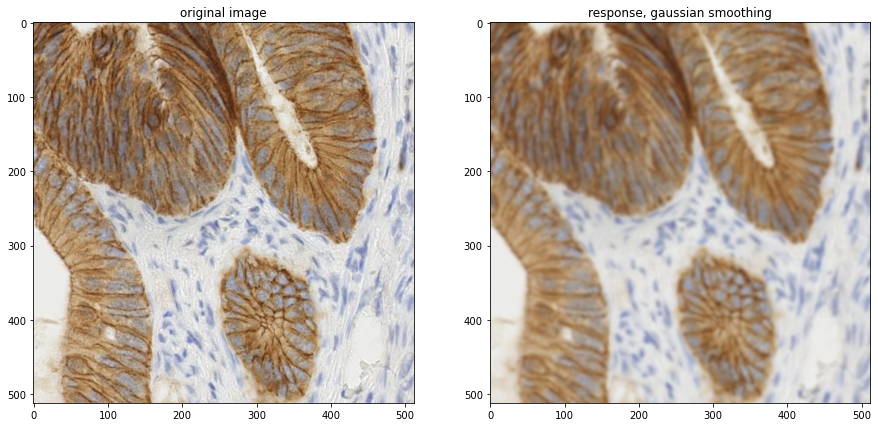

In [10]:
import matplotlib.pyplot as plt
import numpy as np

from skimage import filters

image_hist = data.immunohistochemistry()

sigma = 2

gauss_filtered_img = filters.gaussian(image_hist, sigma=sigma, multichannel=True)

plt.figure(figsize=(15,8))
plt.subplot(121)
plt.gca().set_title('original image')
plt.imshow(image_hist, cmap=plt.cm.gray)
plt.subplot(122)
plt.gca().set_title('response, gaussian smoothing')
plt.imshow(gauss_filtered_img, cmap=plt.cm.gray)



### 1.2.2 Sharpening

#### sharpening is sometimes used to enhance a blurry (i.e. crappy) image. 


1. Start with input image
2. Apply gaussian filter with very narrow kernel
3. Subtract filtered image from input image to get only high frequency components
3. Amplify (alpha) and add high frequency components to original input image 


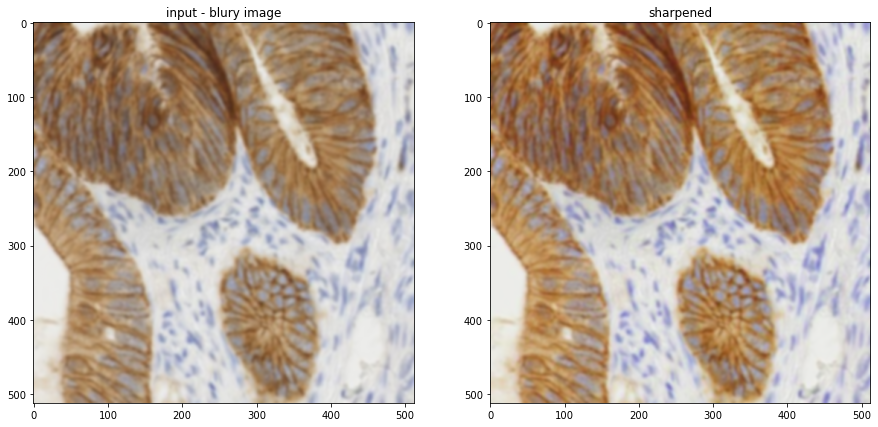

In [11]:
filter_blurred_f = filters.gaussian(gauss_filtered_img, sigma=0.5, multichannel=False)
alpha = 3
sharpened = gauss_filtered_img + alpha * (gauss_filtered_img - filter_blurred_f)


plt.figure(figsize=(15,8))
plt.subplot(121)
plt.gca().set_title('input - blury image')
plt.imshow(gauss_filtered_img, cmap=plt.cm.gray)
plt.subplot(122)
plt.gca().set_title('sharpened')
plt.imshow(sharpened, cmap=plt.cm.gray)


## More Intuition about filters
### Filtering an image is a form of pattern matching. When we apply a filter to an image, we get maximal response in the areas of the image that are most similar to the filter kernel. 

#### Consider the following image: 
<img src="./images/I.png" width="500" height="150">

#### We are interested in finding the locations of smiley faces in the image. We'll make a smiley-filter and apply it to our image:
<img src="./images/fxI.png" width="500" height="150">

#### We can interpert the resulting image as "how similar is this area to a smiley?":
<img src="./images/r.png" width="500" height="150">

#### Notice that while the actual smileys get the highest response, a circle also looks somewhat like a smiley, but less, and a triangle even less so. To find the actual smileys we will need to threshold this image and only keep areas with the highest smileyness.


### 1.2.3 Edge enhancement

#### Edge detecting filters work by measuring the local spatial gradient of an image. Common types are the Sobel, Prewitt and Roberts. 

#### The filters are usually applied to each direction individually and then the total magnitude of the gradient is calculated.
$|\nabla| = \sqrt{\nabla_x^2+\nabla_y^2}$

#### Sobel: 
<img src="./images/sobmasks.gif" width="200" height="100" align="left">

<br><br><br><br>

#### Prewitt: 
<img src="./images/premasks.png" width="200" height="100" align="left">

<br><br><br><br>

#### Roberts: 
<img src="./images/robmasks.gif" width="200" height="100" align="left">



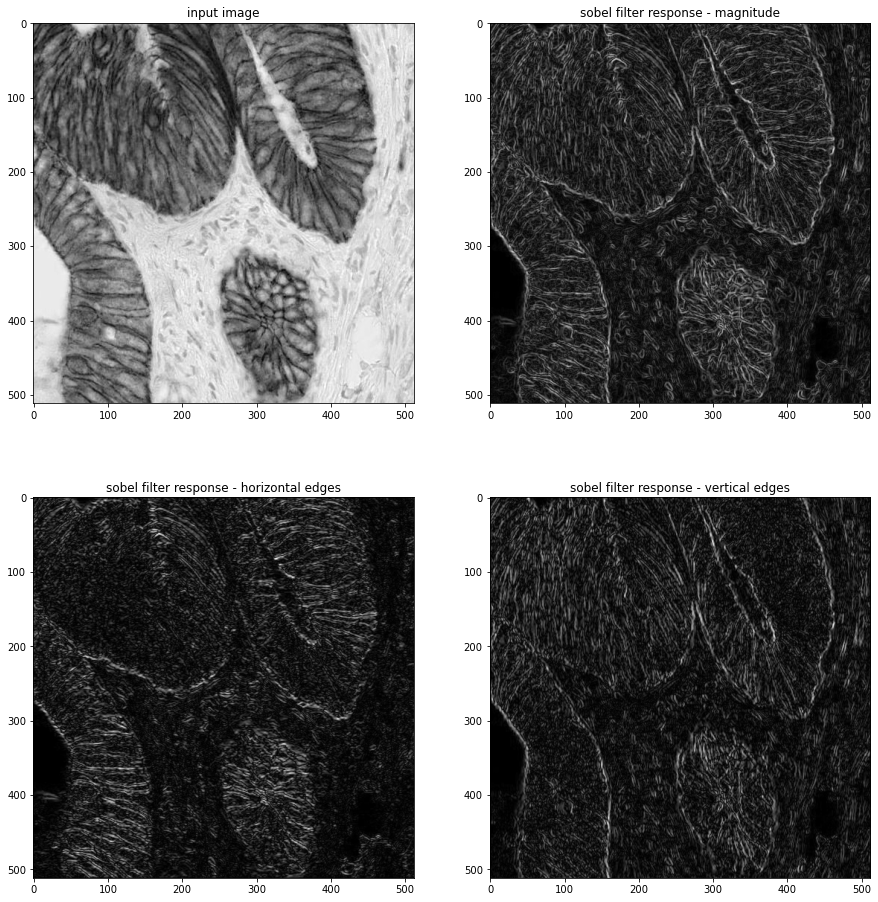

In [12]:
from skimage import data
image_hist = data.immunohistochemistry()
image_hist = image_hist[:,:,2]

# sobel magnitude
filtered_img = filters.sobel(image_hist)
# sobel horizontal
filtered_img_h = filters.sobel_h(image_hist)
# sobel vertical
filtered_img_v = filters.sobel_v(image_hist)

plt.figure(figsize=(15,16))
plt.subplot(221)
plt.gca().set_title('input image')
plt.imshow(image_hist, cmap=plt.cm.gray)
plt.subplot(222)
plt.gca().set_title('sobel filter response - magnitude')
plt.imshow(filtered_img, cmap=plt.cm.gray)
plt.subplot(223)
plt.gca().set_title('sobel filter response - horizontal edges')
plt.imshow(np.abs(filtered_img_h), cmap=plt.cm.gray)
plt.subplot(224)
plt.gca().set_title('sobel filter response - vertical edges')
plt.imshow(np.abs(filtered_img_v), cmap=plt.cm.gray)

#### Direct application of edge detectors often results in somewhat noisy responses. A way to overcome this is by first smoothing the image with a gaussian filter and then applying the edge filter. The width of the gaussian kernel will determine the size of edges the filter detects.

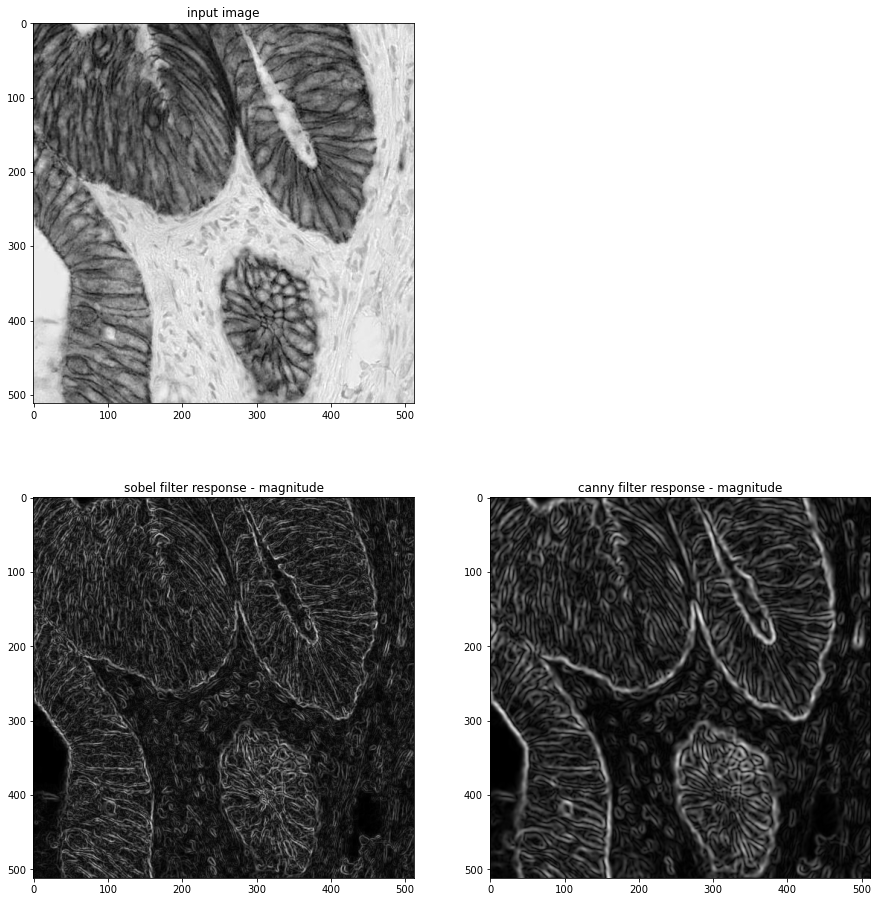

In [13]:
from skimage import data
from skimage import feature

image_hist = data.immunohistochemistry()
image_hist = image_hist[:,:,2]

# sobel magnitude
filtered_img = filters.sobel(image_hist)

DoG_img = filters.sobel(filters.gaussian(image_hist,sigma=2))

plt.figure(figsize=(15,16))
plt.subplot(221)
plt.gca().set_title('input image')
plt.imshow(image_hist, cmap=plt.cm.gray)

plt.subplot(223)
plt.gca().set_title('sobel filter response - magnitude')
plt.imshow(filtered_img, cmap=plt.cm.gray)
plt.subplot(224)
plt.gca().set_title('canny filter response - magnitude')
plt.imshow(DoG_img, cmap=plt.cm.gray)

#### DoG is the also the beginning of the canny edge detection algorithm:
1) Apply DoG filter
2) Apply Non-maximum suppression
3) Apply hysteresis thresholding


### 1.2.4 Gaussian derivatives 
Now let's remember that the application of filters is an associative operation (because convolution is linear!). It's equivalent to apply the gaussian and then the gradient filter to the image and to apply the gradient filter to the gaussian, then apply the result to the image, i.e. $\nabla*(G*I) = (\nabla*G)*I$ where $\nabla$ is the gradient (derivative) filter, $G$ is the gaussian filter, and $I$ is the image.

We can generalize this idea and apply the derivative multiple times, to get a family of interesting filters:

$\nabla^n*G$:

<img src="./images/GaussianDerivs.png" width="800" height="200">

<br><br>

### Let's use a second order derivative (aka a Laplacian) and make a ridge detector:
#### We'll look at a retinal photo where vasculature is an interesting feature
#### We'll invert the images so that the vasculature appears as bright lines on a dark background

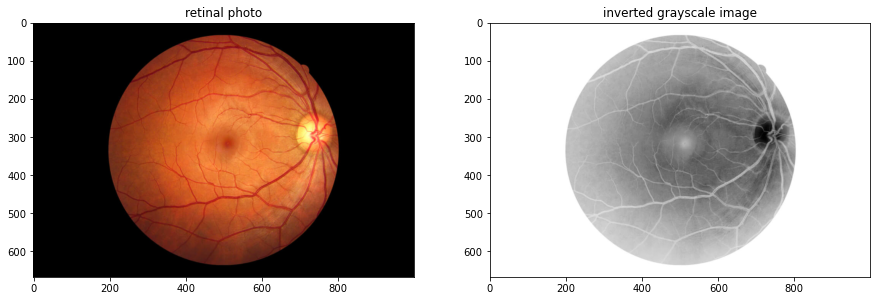

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage.color import rgb2gray
from skimage.util import invert

#this is how we load an image from the hard drive
image_retina = ((img_as_float(mpimg.imread("../Data/RetinalPhoto.png"))))
image_ridges = invert(rgb2gray(image_retina))

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.gca().set_title('retinal photo')
plt.imshow(image_retina, cmap=plt.cm.gray)
plt.subplot(122)
plt.gca().set_title('inverted grayscale image')
plt.imshow(image_ridges, cmap=plt.cm.gray)

#### We find ridges in the inverted image by applying a 2nd order gaussian derivative filter. The second order derivative is called a Laplacian:

Text(0.5, 1.0, 'retinal photo - response to LoG')

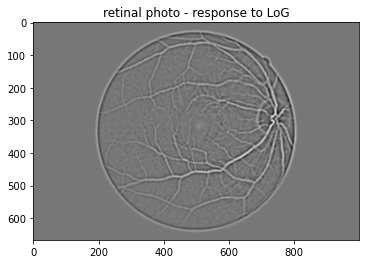

In [15]:
sigma=3
LoG_ridges = filters.laplace(filters.gaussian(image_ridges, sigma=sigma))

plt.imshow(LoG_ridges,cmap='gray')
plt.gca().set_title('retinal photo - response to LoG')


**This commonly used ridge detector is called a Laplacian of Gaussian (LoG)!**

(We'll get back to this image in a bit)

## 1.3 Masking

### A mask is a binary image (0s and 1s) that typically separates a given input image into Foreground (interesting) and Background (boring) regions, or for picking a region-of-interest (ROI). A mask is *applied* to an image by element-wise multiplication. The size of a mask must be *identical* to the size of the image it's applied to.


### Let's begin by creating a simple circular mask. We'll create an array where the value at each point is it's distance from the center of the image, and display it as an image:

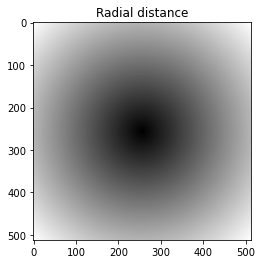

In [16]:
import matplotlib.pyplot as plt
import numpy as np

#dimensions in x and y
y = 512
x = 512

#position of center
centY = np.ceil(y/2)
centX = np.ceil(x/2)

#create the grid
yy,xx = np.indices((y,x))

#create radial distance map
radialDist = np.sqrt((xx-centX)**2 + (yy - centY)**2)

#display
plt.gca().set_title('Radial distance')
plt.imshow(radialDist, cmap='gray', interpolation='nearest')
plt.show()

### Of these points, we'll pick a circle of radius 100 and display it as an image:

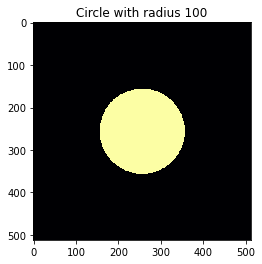

In [17]:
circ1 = radialDist < 100

plt.show()
plt.gca().set_title('Circle with radius 100')
plt.imshow(circ1, cmap='inferno', interpolation='nearest')

#### This object is a **mask**. If you multiply this matrix of 0s and 1s with an image of the same size, only the parts that are ==1 will remain

### Let's apply this mask to our histology image.

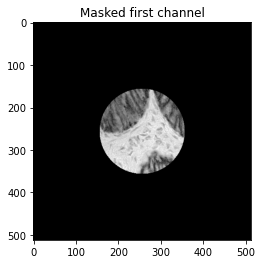

In [18]:
from skimage import data
image_hist = data.immunohistochemistry()
image_hist = image_hist[:,:,2]

plt.gca().set_title('Masked first channel')
plt.imshow(image_hist*circ1, cmap=plt.cm.gray)


### What happens if we invert the mask?

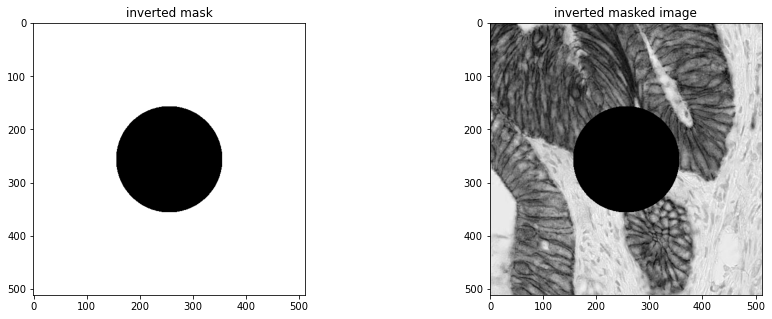

In [19]:
from skimage.util import invert

inverted_mask = invert(circ1)

plt.figure(figsize=(15,5))
plt.subplot(121)
plt.gca().set_title('inverted mask')
plt.imshow(inverted_mask, cmap=plt.cm.gray)
plt.subplot(122)
plt.gca().set_title('inverted masked image')
plt.imshow(image_hist*inverted_mask, cmap=plt.cm.gray)




**Just for closure, let's see what happens when we look at the full RGB image and try to apply the mask**

In [20]:
image = data.immunohistochemistry()
plt.imshow(image*circ1, cmap=plt.cm.gray)

ValueError: operands could not be broadcast together with shapes (512,512,3) (512,512) 

**Whoops. Seems like something is wrong. Our problem is that numpy didn't know how to multiply a 512x512x3 with a 512x512 mask. Numpy makes solving this very easy by adding a singleton dimension (look up broadcasting in your spare time).**

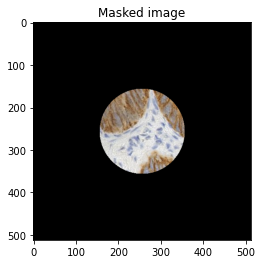

In [21]:
image = data.immunohistochemistry()
plt.gca().set_title('Masked image')
plt.imshow(image*np.expand_dims(circ1,2), cmap=plt.cm.gray)


## 1.4 Thresholding
## 1.4.1 Simple thresholding
### Thresholding an image is the process of setting an intensity (or intensities) for separating the different components of an image.

<img src="./images/Thresholding.png" width="600" height="600" >


#### In simplest case, the foreground and background have very different intensities. In that case thresholding is just clustering pixels by their intensity levels. 


The number of dimensions of the image is:  2
The size of the image is:  (512, 512)


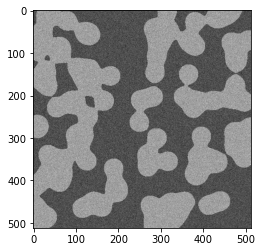

In [22]:
#this function from skimage converts images of integer types into floats, which are easier to work with.
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
from skimage import data

# First, let's create a noisy image of blobs
image_blobs = img_as_float(data.binary_blobs(length=512, seed=1))
sigma = 0.22
image_blobs += np.random.normal(loc=0, scale=sigma, size=image_blobs.shape)

print("The number of dimensions of the image is: ", image_blobs.ndim)
print("The size of the image is: ", image_blobs.shape)
plt.imshow(image_blobs, cmap=plt.cm.gray)

### To find the right threshold, let's examine a histogram of pixel intensity values

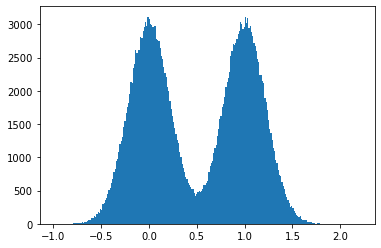

In [23]:
plt.hist(image_blobs.flatten(),bins=250)
plt.show()

Pick an appropriate threshold, by eye, and see if you can remove the background. 
What happens when you increase or decrease the threshold?

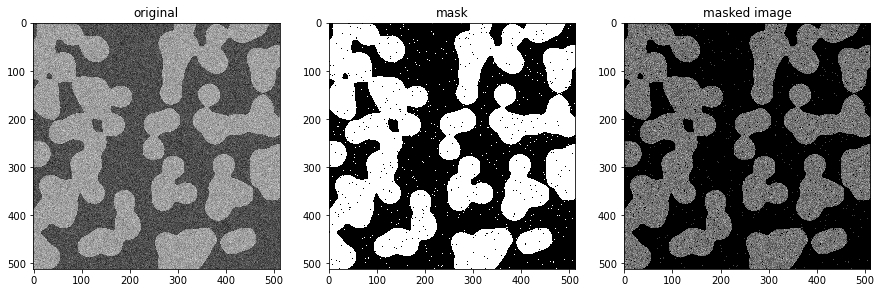

In [24]:
thresh = 0.5

mask = image_blobs>thresh
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.gca().set_title('original')
plt.imshow(image_blobs, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(132)
plt.gca().set_title('mask')
plt.imshow(mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(133)
plt.gca().set_title('masked image')
plt.imshow(image_blobs*mask, interpolation='nearest', cmap=plt.cm.gray)

### Our mask looks ok, but it has a lot of salt & pepper speckle noise. Why is that?
We can try and use what we learned before about filtering to clean up our results. What filter should we use?

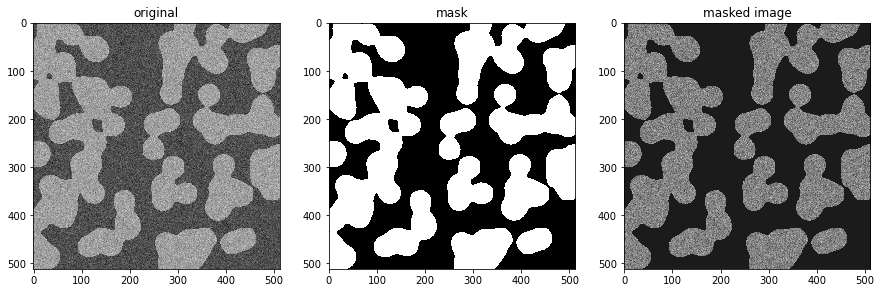

In [25]:
from skimage import filters

thresh = 0.5

mask = filters.gaussian(image_blobs, sigma=1)>thresh

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.gca().set_title('original')
plt.imshow(image_blobs, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(132)
plt.gca().set_title('mask')
plt.imshow(mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(133)
plt.gca().set_title('masked image')
plt.imshow(image_blobs*mask, interpolation='nearest', cmap=plt.cm.gray)

It's usually a good idea before creating a mask to despeckle an image using a narrow gaussian filter!

## 1.4.2 Morphological operations
Morphology is a broad set of image processing operations that process images based on shapes. In a morphological operation, each pixel in the image is adjusted based on the value of other pixels in its neighborhood. By choosing the size and shape of the neighborhood, you can construct a morphological operation that is sensitive to specific shapes in the input image. (explanation from Mathworks)

Morphological operations are based around a *structuring element*, which is a small binary image, often of a disk or a square. The structuring element is positioned at all possible locations in the image and it is compared with the corresponding neighbourhood of pixels. Some operations test whether the element "fits" within the neighbourhood, while others test whether it "hits" or intersects the neighbourhood.

Common operations for image processing

Erosion - output image =1 wherever the structuring element **fits** (erodes the mask)

Dilation - output image =1 wherever the structuring element **hits** (expands the mask)

Opening - Erosion followed by dilation (opens gaps in spots where the mask is weakly connected)

Closing - Dilation followed by erosion (closes holes in the mask)


A very thorough explanation of morphological operationscould be found [here](https://www.cs.auckland.ac.nz/courses/compsci773s1c/lectures/ImageProcessing-html/topic4.htm)

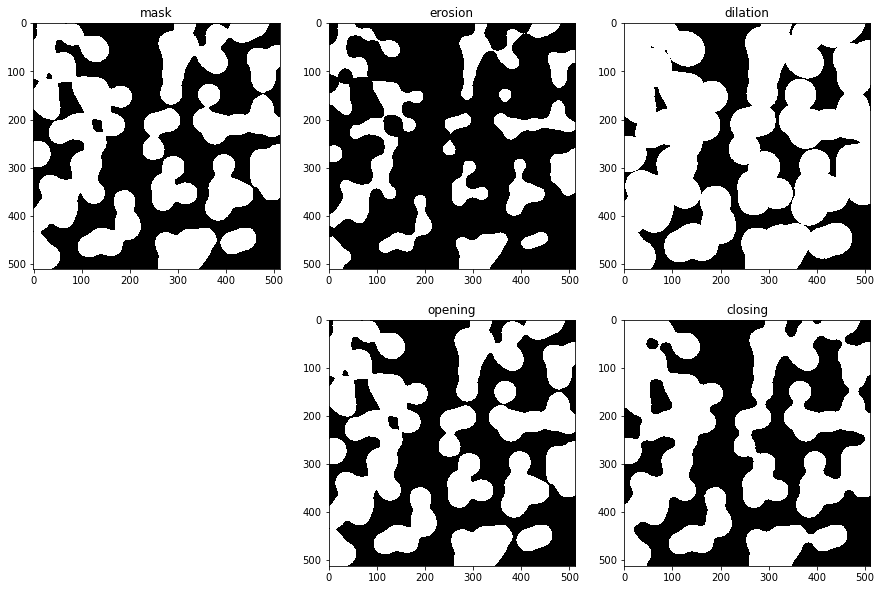

In [26]:
from skimage.morphology import erosion, dilation, opening, closing
from skimage.morphology import disk

#define a "disk" structuring element
selem = disk(10)

erosion_mask = erosion(mask, selem)
dilation_mask = dilation(mask, selem)
opening_mask = opening(mask, selem)
closing_mask = closing(mask, selem)

plt.figure(figsize=(15,10))
plt.subplot(231)
plt.gca().set_title('mask')
plt.imshow(mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(232)
plt.gca().set_title('erosion')
plt.imshow(erosion_mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(233)
plt.gca().set_title('dilation')
plt.imshow(dilation_mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(235)
plt.gca().set_title('opening')
plt.imshow(opening_mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(236)
plt.gca().set_title('closing')
plt.imshow(closing_mask, interpolation='nearest', cmap=plt.cm.gray)


## 1.4.3 Masking actual data

### We'll repeat the thresholding procedure using an actual microscopy image of fluorescent nuclei 

The number of dimensions of the image is:  2
The size of the image is:  (940, 1392)


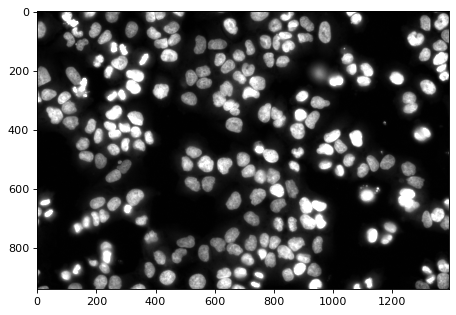

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg

#this is how we load an image from the hard drive
image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))


fig = plt.figure(num=None, figsize=(7.1, 4.6), dpi=80, facecolor='w', edgecolor='k')
print("The number of dimensions of the image is: ", image_nuclei.ndim)
print("The size of the image is: ", image_nuclei.shape)
plt.imshow(image_nuclei, cmap=plt.cm.gray, vmin=0, vmax=0.01)

### Again, let's plot a histogram of intensity values

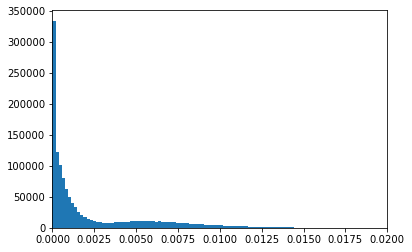

In [28]:
plt.hist(image_nuclei.flatten(),bins=250)
plt.xlim((0, 0.02))
plt.show()


### And again we'll pick a value by eye:

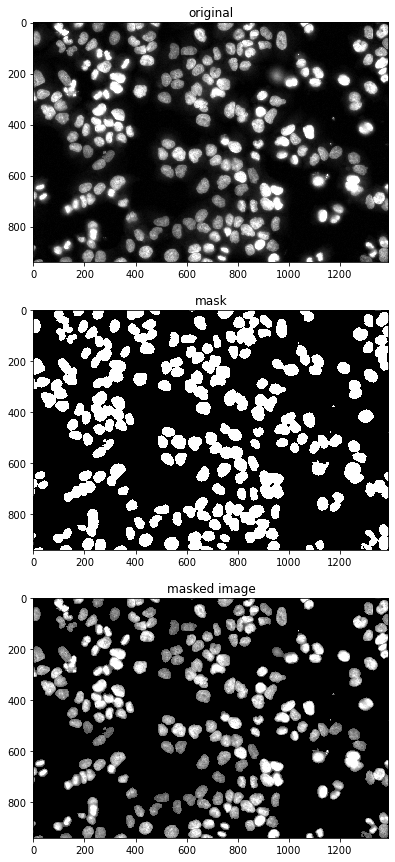

In [29]:
thresh = 0.003

#remember to despeckle before creating a mask!
mask = filters.gaussian(image_nuclei, sigma=1)>thresh
plt.figure(figsize=(8,15))
plt.subplot(311)
plt.gca().set_title('original')
plt.imshow(image_nuclei, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=0.01)
plt.subplot(312)
plt.gca().set_title('mask')
plt.imshow(mask, interpolation='nearest', cmap=plt.cm.gray)
plt.subplot(313)
plt.gca().set_title('masked image')
plt.imshow(image_nuclei*mask, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=0.01)

### Not bad! But also not very scalable. If we have 100s of images we can't look at them one-by-one and find thresholds by eye. Next, we'll look at some methods for automatically finding the thresholds.

## 1.5 Automated threshold calculation

### There is a very large list of algorithms for threshold calculation out there that are optimized for different situations. We will briefly review a few of the most common ones.

### 1.5.1 Iterative mean thresholding
Algorithm:
1. Start with some threshold $T_i$
2. Compute the means $m_0$ and $m_1$ of the BG and FG
3. Update $T_{i+1} = \frac{m_0+m_1}{2}$
4. Repeat until it converges

<img src="./images/meanThresh.gif" width="400" height="400" >

### 1.5.2 Otsu thresholding
The algorithm exhaustively searches for the threshold that minimizes the intra-class variance, defined for a given threshold $T$ as a weighted sum of variances of the two classes:
$\sigma^2_w(T)=\omega_0(T)\sigma^2_0(T)+\omega_1(T)\sigma^2_1(T)$

For 2 classes, minimizing the intra-class variance is equivalent to maximizing inter-class variance, which is much easier to calculate:
\begin{align}
\sigma^2_b(T) & =\sigma^2-\sigma^2_w(T)=\omega_0(\mu_0-\mu_T)^2+\omega_1(\mu_1-\mu_T)^2 \\
& =\omega_0(T) \omega_1(T) \left[\mu_0(T)-\mu_1(T)\right]^2
\end{align}

<img src="./images/Otsu's_Method_Visualization.gif" width="400" height="400" >

### 1.5.3 Triangle thresholding
Algorithm:
1. Draw a straight line between the histogram peak and the brightest value.
2. From every point on that line, draw the shortest connecting line to the histogram.
3. Find longest of these connecting lines.
4. Threshold is set at the intersection of that line and the curve.
<img src="./images/triThresh.png" width="400" height="400" >

*note: Triangle thresholding is good for situations where the image is mostly background, and there is no clear "peak" of bright pixels.*


### [scikit-image's filters module](https://scikit-image.org/docs/dev/api/skimage.filters.html) implements a large variety of thresholding algorithms. Let's apply the ones we just learned about.


In [30]:
from skimage import filters

meanThresh = filters.threshold_mean(image_nuclei)
print(meanThresh)

OtsuThresh = filters.threshold_otsu(image_nuclei)
print(OtsuThresh)

TriThresh = filters.threshold_triangle(image_nuclei)
print(TriThresh)


0.0023766113
0.0040662913
0.0022590505


### Let's look at the resulting masks we get with each of these thresholds

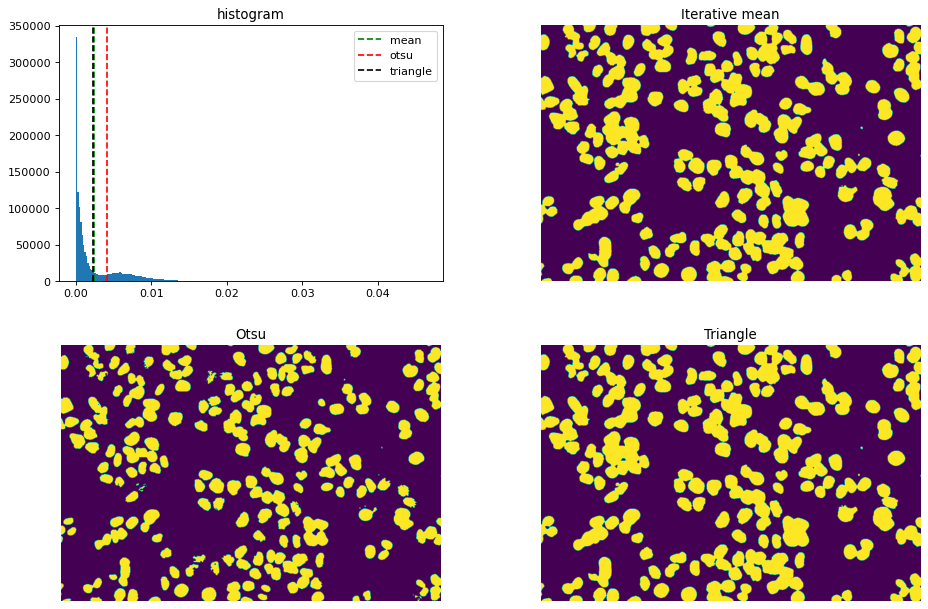

In [31]:
fig = plt.figure(num=None, figsize=(12, 8), dpi=80)
ax1 = fig.add_axes([0.1,0.6,0.4,0.4])

ax1.hist(image_nuclei.flatten(),bins=250)

ax1.axvline(meanThresh, color='g', linestyle='--')
ax1.axvline(OtsuThresh, color='r', linestyle='--')
ax1.axvline(TriThresh, color='k', linestyle='--')

ax1.legend(['mean' ,'otsu', 'triangle'])
ax1.set_title('histogram')

ax2 = fig.add_axes([0.6,0.6,0.4,0.4])
mask_mean = filters.gaussian(image_nuclei, sigma=1)>meanThresh

ax2.imshow(mask_mean)
ax2.set_title('Iterative mean')
ax2.set_axis_off()

ax2 = fig.add_axes([0.1,0.1,0.4,0.4])
mask_otsu = filters.gaussian(image_nuclei, sigma=1)>OtsuThresh

ax2.imshow(mask_otsu)
ax2.set_title('Otsu')
ax2.set_axis_off()

ax2 = fig.add_axes([0.6,0.1,0.4,0.4])
mask_tri = filters.gaussian(image_nuclei, sigma=1)>TriThresh

ax2.imshow(mask_tri)
ax2.set_title('Triangle')
ax2.set_axis_off()


### Let's briefly look back at the retinal images and try to mask only the vasculature:

**load the image and apply LoG filter:**

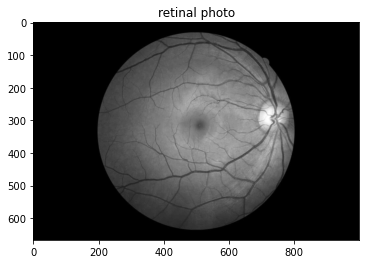

In [32]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage.color import rgb2gray

#this is how we load an image from the hard drive
image_ridges = rgb2gray(img_as_float(mpimg.imread("../Data/RetinalPhoto.png")))

plt.imshow(image_ridges, cmap=plt.cm.gray)
plt.gca().set_title('retinal photo')
sigma = 3
LoG_ridges = filters.laplace(filters.gaussian(invert(image_ridges), sigma=sigma))
ax2.set_axis_off()


**Now, let's do the same procedure of automatically finding thresholds:**

-5.361737e-13
0.002177109
0.000341843


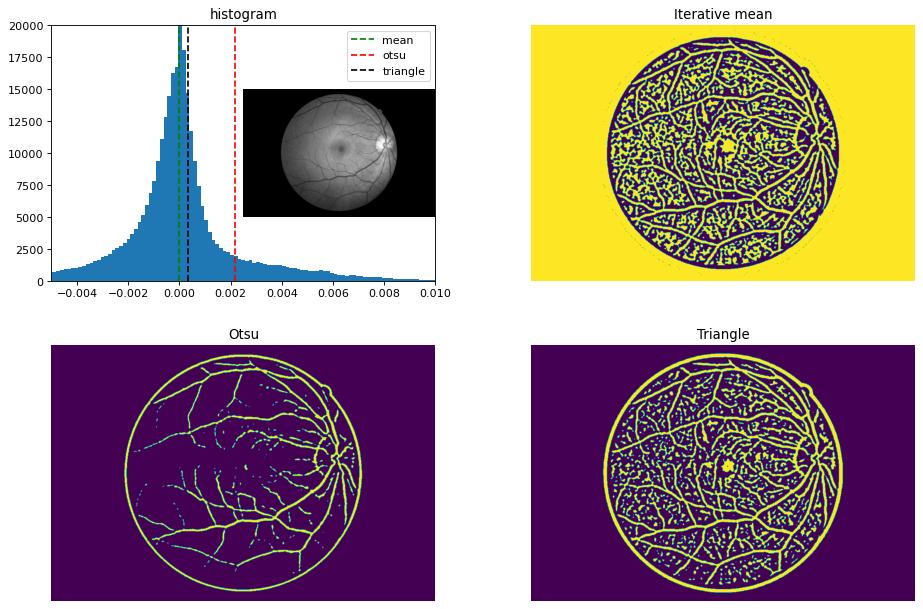

In [53]:
from skimage import filters

meanThresh = filters.threshold_mean(LoG_ridges)
print(meanThresh)

OtsuThresh = filters.threshold_otsu(LoG_ridges)
print(OtsuThresh)

TriThresh = filters.threshold_triangle(LoG_ridges)
print(TriThresh)

fig = plt.figure(num=None, figsize=(12, 8), dpi=80)
ax1 = fig.add_axes([0.1,0.6,0.4,0.4])

ax1.hist(LoG_ridges.flatten(),bins=250)

ax1.axvline(meanThresh, color='g', linestyle='--')
ax1.axvline(OtsuThresh, color='r', linestyle='--')
ax1.axvline(TriThresh, color='k', linestyle='--')
plt.ylim((0,20000))
plt.xlim((-0.005,0.01))
ax1.legend(['mean' ,'otsu', 'triangle'])

ax1.set_title('histogram')

ax1 = fig.add_axes([0.3,0.65,0.2,0.3])

plt.imshow(image_ridges, cmap=plt.cm.gray)
ax1.set_axis_off()


ax2 = fig.add_axes([0.6,0.6,0.4,0.4])
mask_mean = LoG_ridges>meanThresh

ax2.imshow(mask_mean)
ax2.set_title('Iterative mean')
ax2.set_axis_off()

ax2 = fig.add_axes([0.1,0.1,0.4,0.4])
mask_otsu = LoG_ridges>OtsuThresh

ax2.imshow(mask_otsu)
ax2.set_title('Otsu')
ax2.set_axis_off()

ax2 = fig.add_axes([0.6,0.1,0.4,0.4])
mask_tri = LoG_ridges>TriThresh

ax2.imshow(mask_tri)
ax2.set_title('Triangle')
ax2.set_axis_off()

**Play around with the width of the gaussian. Which thresholding algorithm works best in this case?**

### 1.5.4 Local thresholding
#### All of the methods we saw so far are *global* in the sense that the same threshold is applied to the whole picture. Sometimes we can have an image with vastly different intensity distributions at different locations. Using local thresholding, we can overcome such cases.

Let's compare the results from a global (Otsu) and a local threshold. 

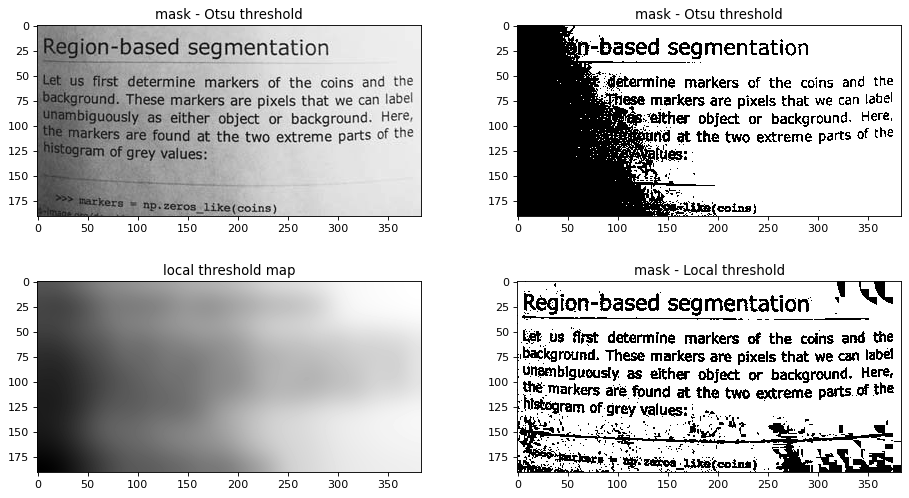

In [54]:
from skimage import data

image = data.page()
fig = plt.figure(num=None, figsize=(12, 8), dpi=80)

#global thresholding
threshGlobal = filters.threshold_otsu(image)

ax1 = fig.add_axes([0.1,0.6,0.4,0.4])
ax1.set_title('mask - Otsu threshold')
plt.imshow(image ,cmap='gray')

ax2 = fig.add_axes([0.6,0.6,0.4,0.4])
ax2.set_title('mask - Otsu threshold')
plt.imshow(image>threshGlobal,cmap='gray')

#local thresholding

#Try and change this number and see what happens
block_size  = 81

threshLocal = filters.threshold_local(image, block_size)

ax1 = fig.add_axes([0.1,0.2,0.4,0.4])
ax1.imshow(threshLocal,cmap='gray')
ax1.set_title('local threshold map')


ax2 = fig.add_axes([0.6,0.2,0.4,0.4])
ax2.set_title('mask - Local threshold')
plt.imshow(image>threshLocal,cmap='gray')


# 2. Image segmentation
### Image segmentation is the process of partitioning a digital image into multiple segments. The goal of segmentation is to simplify and/or change the representation of an image into something that is more meaningful and easier to analyze.
<img src="./images/imageSegmentation.png" width="400" height="400" >

## 2.1 Connected components
### After we generate a mask, the simplest segmentation involves simply looking for regions in the mask that are connected and labeling each one as a separate object. 

#### We begin by generating a simple mask using the triangle threshold method:

In [55]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage import filters

image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))
TriThresh = filters.threshold_triangle(image_nuclei)
#despeckle
mask = filters.gaussian(image_nuclei, sigma=1)>TriThresh

### [scikit-image's measure module](https://scikit-image.org/docs/dev/api/skimage.measure.html) implements a  variety of useful methods for segmentation. the *label* function returns a *labeled image* of connected components (CCs). Each CC is uniquely numbered by an integer.

$\begin{bmatrix} 
1 & 1 & 0 & 0 & 2\\
1 & 1 & 0 & 2 & 2\\
0 & 0 & 0 & 0 & 0\\
0 & 3 & 0 & 4 & 4\\
0 & 0 & 0 & 4 & 4\\
\end{bmatrix}$


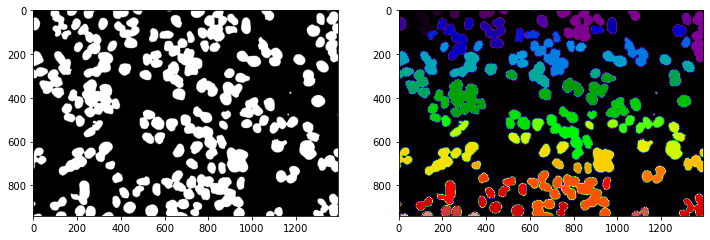

In [56]:
from skimage import measure
labels = measure.label(mask)

plt.figure(figsize=(12,5))

plt.subplot(121)
plt.imshow(mask, cmap='gray')
plt.subplot(122)
plt.imshow(labels, cmap='nipy_spectral')

#### We can easily generate a *mask* for a **specific** CC using the binary operation *labels==i*

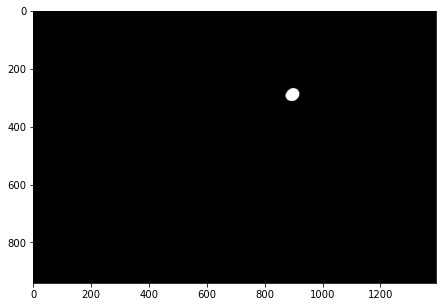

In [57]:
i=43
mask_of_CC_i = labels==i

plt.figure(figsize=(10,5))
plt.imshow(mask_of_CC_i, cmap='gray')

## Problem with simple CC segmentation : overlapping objects

### We often really care about having only a single object per label. Using CC, any overlapping objects will merge into one blob:

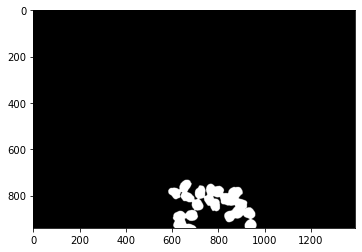

In [58]:
i=87
mask_of_CC_i = labels==i
plt.imshow(mask_of_CC_i, cmap='gray')

### These problems can be partially resolved using morphological operations, but there's no silver bullet

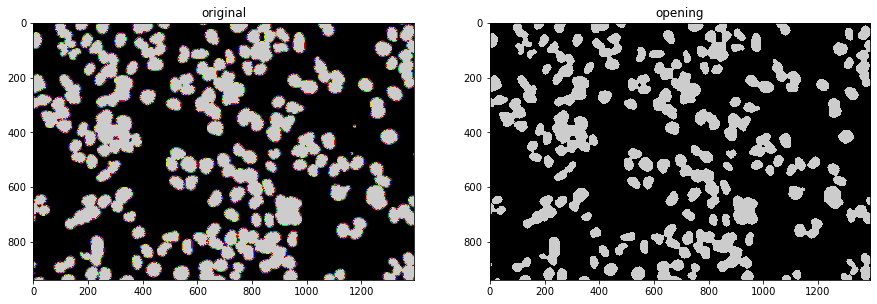

In [59]:
from skimage.morphology import erosion, dilation, opening, closing
from skimage.morphology import disk

#define a "disk" structuring element
selem1 = disk(10)
selem2 = disk(7)

plt.figure(figsize=(15,10))
plt.subplot(121)
plt.gca().set_title('original')
plt.imshow(mask, cmap='nipy_spectral')
plt.subplot(122)
plt.gca().set_title('opening')
plt.imshow(dilation(erosion(mask, selem1),selem2), interpolation='nearest', cmap='nipy_spectral')


## 2.2 Watershed based segmentation

### 2.2.1 The watershed algorithm
 The watershed transformation treats the image it operates upon like a topographic map, with the brightness of each point representing its height, and finds the lines that run along the tops of ridges.

<img src="./images/Diagram-of-watershed-algorithm.png" width="400" height="400" >

More precisely, the algorithm goes as follows:
1. *Label* local minima (i.e. $S_1$, $S_2$)
2. Move to next higher intensity level
3. Assign to each point the label of it's closest label set.
**<font color='red'>Points equidistant to multiple sets are labeled as boundaries and intensities set to 0</font>**
4. Repeat until all points are labeled

<img src="./images/watershed1.png" width="400" height="400" >

Let's start with a very naive application. We will invert the image, and then simply apply the *watershed* function from the [scikit-image segmentation module](https://scikit-image.org/docs/dev/api/skimage.segmentation.html). The function returns a labeled image.

<Figure size 1080x720 with 0 Axes>

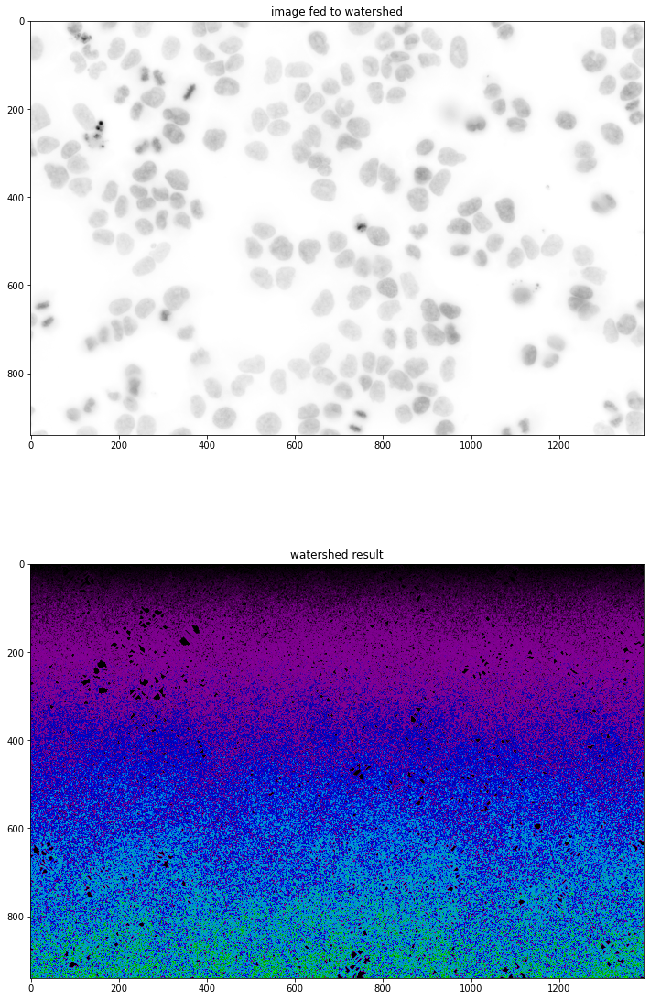

In [65]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage import filters

from skimage.util import invert
from skimage.segmentation import watershed


image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))

#invert image
inverted_image = invert(image_nuclei)

image_to_watershed = inverted_image

#Calculate watershed transform
labels_naive = watershed(image_to_watershed, watershed_line = 1)
plt.figure(figsize=(15,10))

#let's look at all the boundaries
plt.figure(figsize=(12,20))
plt.subplot(211)
plt.gca().set_title('image fed to watershed')
plt.imshow(image_to_watershed, cmap='gray')
plt.subplot(212)
plt.gca().set_title('watershed result')
plt.imshow(filters.sobel(labels_naive), cmap='nipy_spectral')


### So this clearly didn't work. Why? How do we fix it?

Noise generates a ton of local minima. Each gets its own basin. This leads to massive oversegmentation.

#### Watershed segmentation is only a *part* of a segmentation pipeline. Preprocessing (denoising, smoothing, seeding minima) of the image is CRUCIAL for it to work well. 

<img src="./images/PreprocessingApproaches.png" width="600" height="400" >

The first thing we'll do is to apply the mask that we found before. This is simply done by adding a *mask* argument to the watershed function.

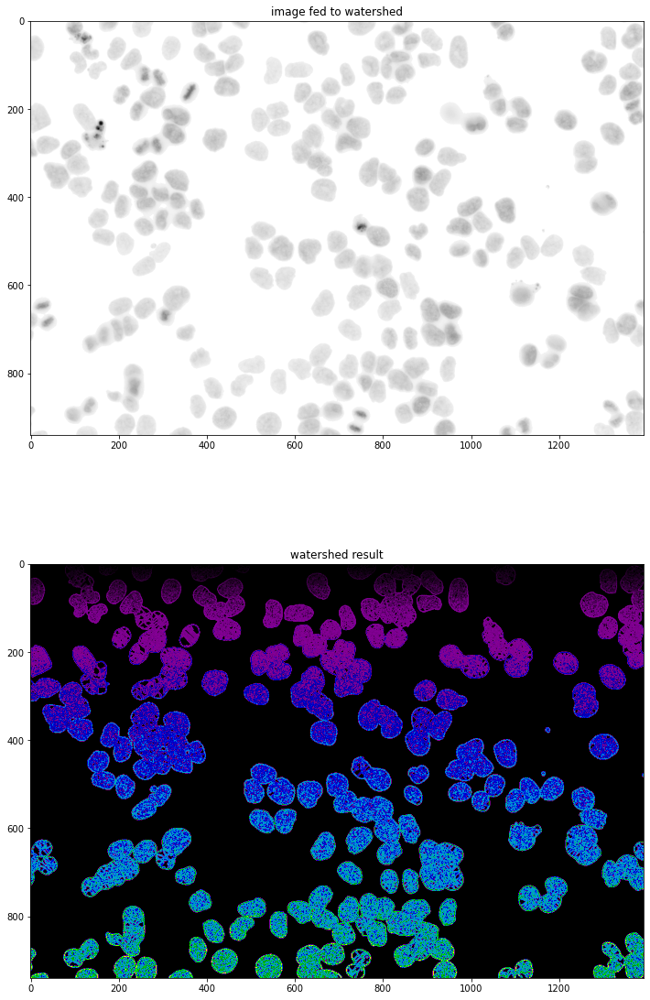

In [66]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage import filters

from skimage.util import invert
from skimage.segmentation import watershed

image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))

TriThresh = filters.threshold_triangle(image_nuclei)

mask = filters.gaussian(image_nuclei, sigma=1)>TriThresh

#mask and invert image
masked_image = image_nuclei*mask
inverted_masked_image = invert(masked_image)

image_to_watershed = inverted_masked_image
#Calculate watershed transform
#pass the mask to the watershed function so it avoids segmenting the BG
labels_masked = watershed(image_to_watershed, watershed_line = 1, mask=mask)

#let's look at all the boundaries
plt.figure(figsize=(12,20))
plt.subplot(211)
plt.gca().set_title('image fed to watershed')
plt.imshow(image_to_watershed, cmap='gray')
plt.subplot(212)
plt.gca().set_title('watershed result')
plt.imshow(filters.sobel(labels_masked), cmap='nipy_spectral')


#### So we got rid of all the BG regions, but we are still oversegmenting. Why?

Let's try to smoothen the image and get rid of the many local minima. How wide should the gaussian kernel be?

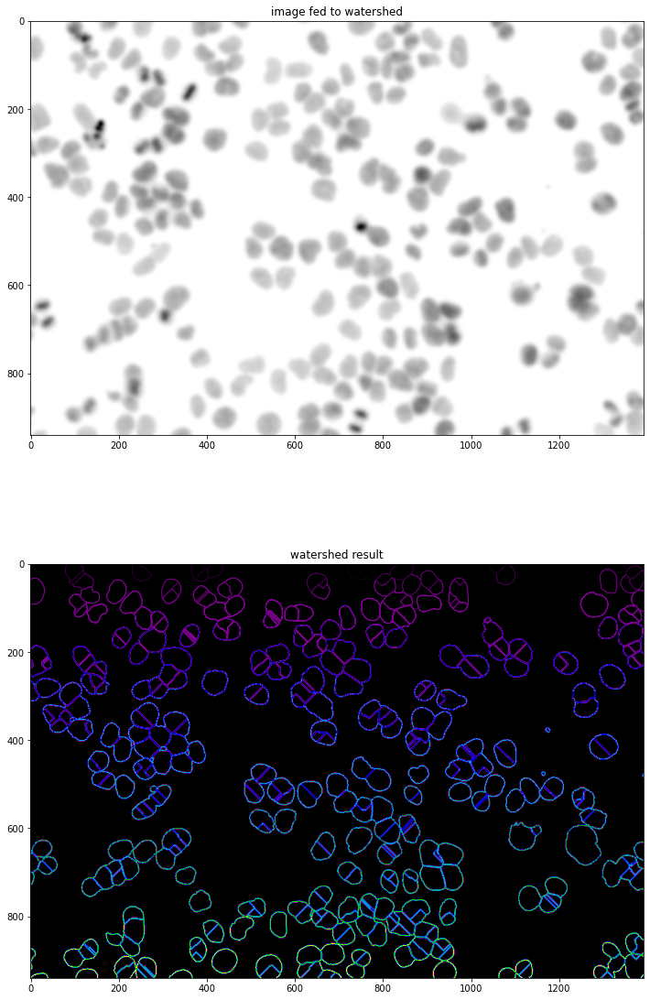

In [67]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage import filters

from skimage.util import invert
from skimage.morphology import thin
from skimage.segmentation import watershed

image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))

TriThresh = filters.threshold_triangle(image_nuclei)

#Calculate mask
mask = filters.gaussian(image_nuclei, sigma=1)>TriThresh

#mask, smooth, and invert the image
image_to_watershed = image_nuclei*mask
sigma_for_smoothing = 4
smoothed_masked_image = filters.gaussian(image_to_watershed, sigma=sigma_for_smoothing)
inverted_smoothed_masked_image = invert(smoothed_masked_image)

image_to_watershed = inverted_smoothed_masked_image
#Calculate watershed transform
#pass the mask to the watershed function so it avoids segmenting the BG
labels_masked_smooth = watershed(image_to_watershed, watershed_line = 1, mask=mask)

#let's look at all the boundaries
plt.figure(figsize=(12,20))
plt.subplot(211)
plt.gca().set_title('image fed to watershed')
plt.imshow(image_to_watershed, cmap='gray')
plt.subplot(212)
plt.gca().set_title('watershed result')
plt.imshow(filters.sobel(labels_masked_smooth), cmap='nipy_spectral')


### We're starting to get somewhere!! Can we do better?

#### We can do more to help the algorithm by providing local markers (seeds) from which to start the process

#### We will find seeds by calculating local maxima over areas that are larger than 30x30 pixels using the footprint argument for the function peak_local_max

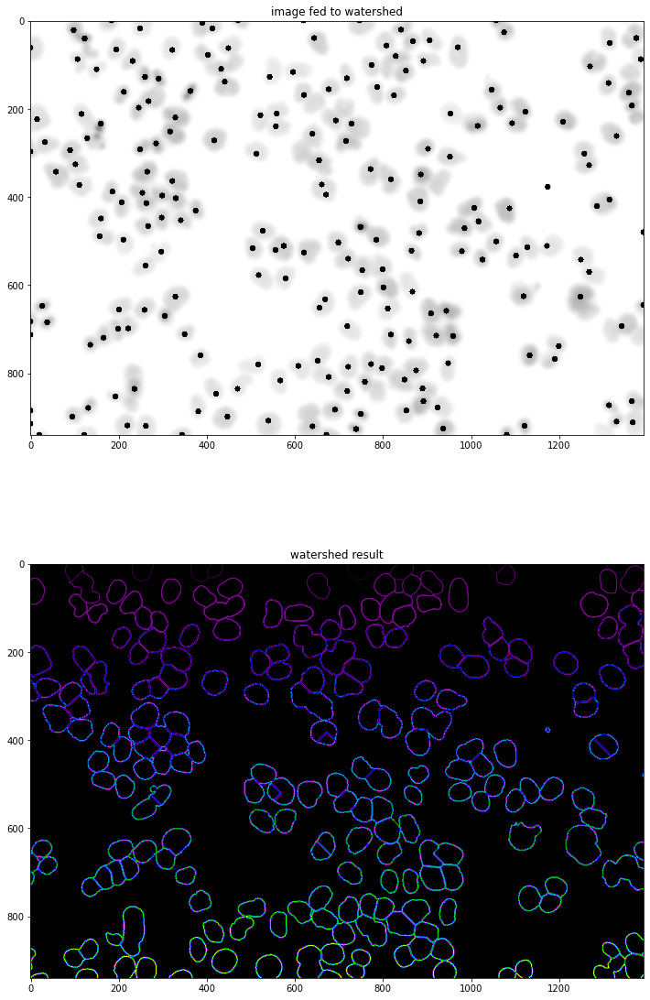

In [68]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import img_as_float
import matplotlib.image as mpimg
from skimage import filters
from skimage import measure
from skimage.morphology import disk
from skimage.morphology import erosion, dilation, opening, closing

from skimage.util import invert
from skimage.segmentation import watershed

from skimage.feature import peak_local_max

image_nuclei = img_as_float(mpimg.imread("../Data/xy040-1.png"))


mask = filters.gaussian(image_nuclei, sigma=1)>TriThresh


#mask, smooth, and invert the image
masked_image = image_nuclei*mask
sigma_for_smoothing = 4
smoothed_masked_image = filters.gaussian(masked_image, sigma=sigma_for_smoothing)
inverted_smoothed_masked_image = invert(smoothed_masked_image)

image_to_watershed = inverted_smoothed_masked_image

#find local peaks to use as seeds
MaskedImagePeaks = peak_local_max(invert(image_to_watershed), footprint=np.ones((30, 30)), threshold_abs=None, threshold_rel=None, exclude_border=False, indices=False).astype('int')

#This is for presentation of our markers
#create disk structuring element of radius 5
selem = disk(5)
#dilate local peaks so that close ones merge
peakMask = dilation(MaskedImagePeaks,selem)
# label local peak regions to find initial markers
markers = measure.label(peakMask)


#pass the *markers* argument to the watershed function
labels_localmax_markers = watershed(image_to_watershed,markers=markers, watershed_line = 1, mask=mask)

#let's look at all the boundaries
plt.figure(figsize=(12,20))
plt.subplot(211)
plt.gca().set_title('image fed to watershed')
plt.imshow(image_to_watershed-peakMask, cmap='gray')
plt.clim((0.95, 1))
plt.subplot(212)
plt.gca().set_title('watershed result')
plt.imshow(filters.sobel(labels_localmax_markers), cmap='nipy_spectral')




#### This is pretty good! We're still getting a few errors here and there, but there's no big systematic over- or under- segmentation. This is a typical good result when dealing with real data. 

# 3. Feature extraction
### Feature extraction is a process of dimensionality reduction by which an initial raw image is reduced to a list of objects and attributes

<img src="./images/feat_ext.png" width="600" height="400" >

## 3.1 Extracting region properties

### [scikit-image's measure module](https://scikit-image.org/docs/dev/api/skimage.measure.html)  implements a  method called *regionprops* that accepts a labeled mask of connected components, and, optionally, a corresponding image, and returns a list.  Each object on the list contains useful data about the size, shape, position, and intensity ([see the full list here](https://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.regionprops)) of a specific component. 

The length of the list is equal to the total number of objects detected. 


#### We'll start by extracting the number of CC we found and the area of each CC

In [69]:
from skimage import measure

#We use regionprops to extract properties on all the CCs
props = measure.regionprops(labels_localmax_markers,image_nuclei)
#how many total connected components did we get?
print(len(props))


props[1].perimeter

220


115.97665940288702

(array([ 9., 20., 34., 43., 38., 37., 15., 13.,  9.,  2.]),
 array([0.00359407, 0.00422991, 0.00486576, 0.0055016 , 0.00613744,
        0.00677328, 0.00740913, 0.00804497, 0.00868081, 0.00931665,
        0.0099525 ], dtype=float32),
 <BarContainer object of 10 artists>)

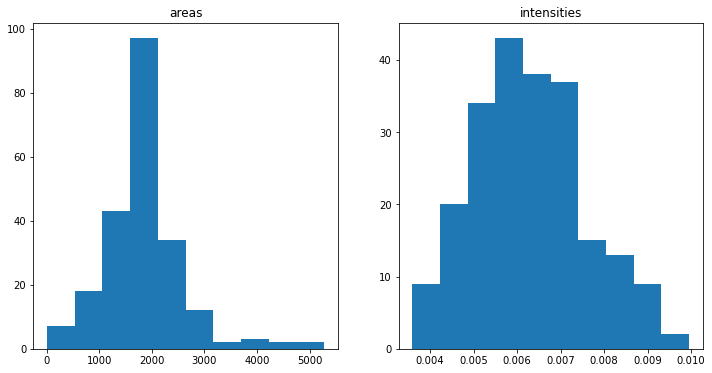

In [72]:
#This is how we make a list of a specific property for each CC
areas = [r.area for r in props]

#Do the same for the "mean_intensity" property
intensities = [r.mean_intensity for r in props]

#let's look at all the boundaries
plt.figure(figsize=(12,6))
plt.subplot(121)
plt.gca().set_title('areas')
plt.hist(areas)
plt.subplot(122)
plt.gca().set_title('intensities')
plt.hist(intensities)

**We can look at indivudual object found**

Text(0.5, 1.0, 'Single cell')

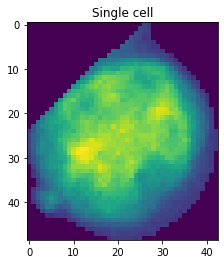

In [73]:
i=10
plt.imshow(props[i].intensity_image)
plt.gca().set_title('Single cell')

**Let's use a scatter plot to compare our results to the image**

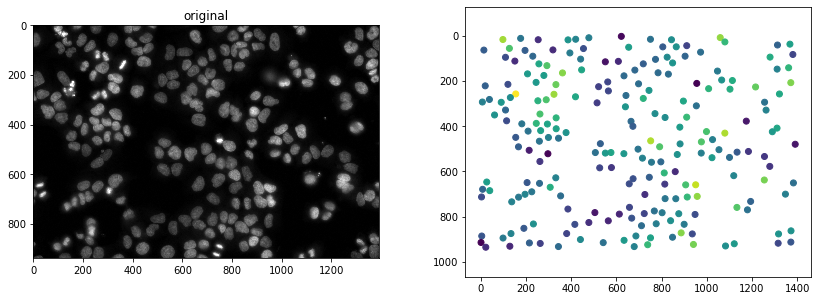

In [74]:
intensities = np.array([r.mean_intensity for r in props])
centroids = np.array([r.centroid for r in props])


fig = plt.figure(figsize=(12,15))
fig.add_axes([0.1,0.6,0.4,0.25])
plt.gca().set_title('original')
plt.imshow(image_nuclei, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=0.02)
fig.add_axes([0.6,0.6,0.4,0.25])
plt.scatter(centroids[:,1],centroids[:,0], c=intensities)
plt.axis('equal')
plt.gca().invert_yaxis()

**Or even nicer scatter plots!**

Text(1079.5749299719887, 26.941176470588236, '11')

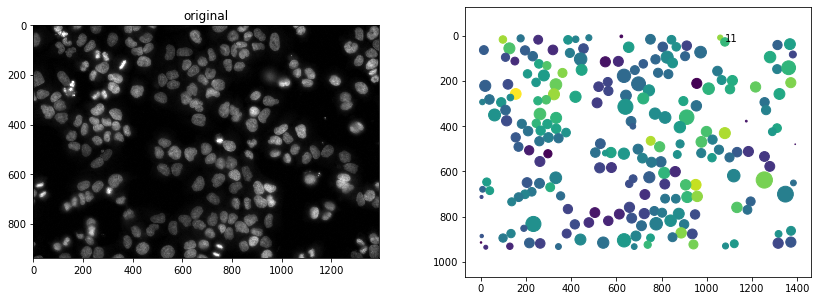

In [75]:
intensities = np.array([r.mean_intensity for r in props])
areas = np.array([r.area for r in props])

centroids = np.array([r.centroid for r in props])


fig = plt.figure(figsize=(12,15))
fig.add_axes([0.1,0.6,0.4,0.25])
plt.gca().set_title('original')
plt.imshow(image_nuclei, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=0.02)
fig.add_axes([0.6,0.6,0.4,0.25])
plt.scatter(centroids[:,1],centroids[:,0], c=intensities, s=areas/20)
plt.axis('equal')
plt.gca().invert_yaxis()

plt.text(centroids[10,1],centroids[10,0],props[10].label)

**You can even draw your points directly on the image!**

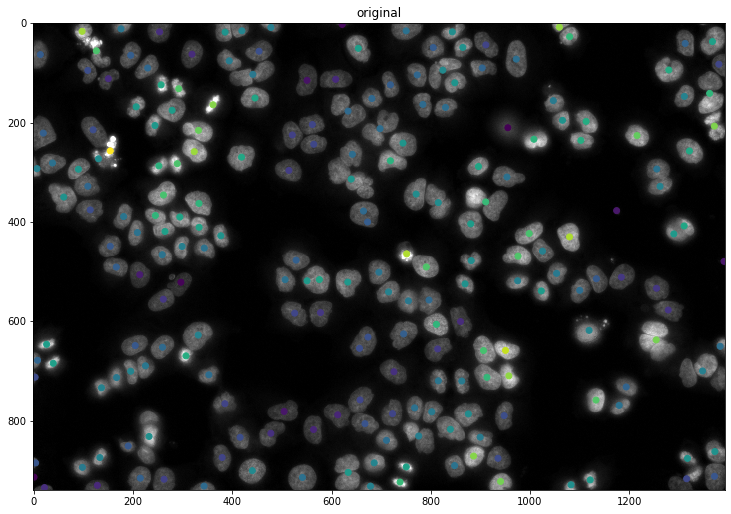

In [76]:
intensities = np.array([r.mean_intensity for r in props])
areas = np.array([r.area for r in props])

centroids = np.array([r.centroid for r in props])


fig = plt.figure(figsize=(12,15))
fig.add_axes([0.1,0.6,0.8,0.5])
plt.gca().set_title('original')
plt.imshow(image_nuclei, interpolation='nearest', cmap=plt.cm.gray, vmin=0, vmax=0.02)
plt.gca().patch.set_alpha(0.5)
plt.scatter(centroids[:,1],centroids[:,0], c=intensities, alpha=1)


#### Let's define some useful functions for converting a list of props into a pandas dataframe. These should become obsolete soon since the new version of scikit-image will have this functionality 

In [77]:
import pandas as pd

def scalar_attributes_list(im_props):
    """
    Makes list of all scalar, non-dunder, non-hidden
    attributes of skimage.measure.regionprops object
    """
    
    attributes_list = []
    
    for i, test_attribute in enumerate(dir(im_props[0])):
        
        #Attribute should not start with _ and cannot return an array
        #does not yet return tuples
        if test_attribute[:1] != '_' and not\
                isinstance(getattr(im_props[0], test_attribute), np.ndarray):                
            attributes_list += [test_attribute]
            
    return attributes_list


def regionprops_to_df(im_props):
    """
    Read content of all attributes for every item in a list
    output by skimage.measure.regionprops
    """

    attributes_list = scalar_attributes_list(im_props)

    # Initialise list of lists for parsed data
    parsed_data = []

    # Put data from im_props into list of lists
    for i, _ in enumerate(im_props):
        parsed_data += [[]]
        
        for j in range(len(attributes_list)):
            parsed_data[i] += [getattr(im_props[i], attributes_list[j])]

    # Return as a Pandas DataFrame
    return pd.DataFrame(parsed_data, columns=attributes_list)

### Now, to get all the properties in table/dataframe form we simply run:

In [78]:
props_df = regionprops_to_df(props)
props_df

,area,bbox,bbox_area,centroid,convex_area,eccentricity,equivalent_diameter,euler_number,extent,filled_area,...,major_axis_length,max_intensity,mean_intensity,min_intensity,minor_axis_length,orientation,perimeter,slice,solidity,weighted_centroid
0,1034,"(0, 152, 27, 202)",1350,"(11.19439071566731, 176.13056092843325)",1063,0.803082,36.284014,1,0.765926,1034,...,48.361710,0.012329,0.006054,0.002090,28.817252,-1.474824,134.219300,"(slice(0, 27, None), slice(152, 202, None))",0.972719,"(9.471141254673604, 177.62865715399982)"
1,737,"(0, 453, 22, 499)",1012,"(8.40841248303935, 477.9036635006784)",748,0.873175,30.632949,1,0.728261,737,...,45.291488,0.011719,0.006293,0.002029,22.075411,1.474012,115.976659,"(slice(0, 22, None), slice(453, 499, None))",0.985294,"(7.391350978747608, 477.89791476736195)"
2,150,"(0, 607, 7, 637)",210,"(2.3066666666666666, 621.5066666666667)",156,0.968575,13.819766,1,0.714286,150,...,28.818028,0.005188,0.003736,0.002182,7.167693,-1.565004,62.349242,"(slice(0, 7, None), slice(607, 637, None))",0.961538,"(2.086598938393352, 621.3798371405671)"
3,1897,"(0, 720, 36, 785)",2340,"(15.205060622034791, 750.3494992092778)",1917,0.823359,49.146062,1,0.810684,1897,...,66.525245,0.009247,0.005963,0.001968,37.754509,-1.483080,175.154329,"(slice(0, 36, None), slice(720, 785, None))",0.989567,"(14.306770283648738, 750.1989996495538)"
4,543,"(0, 1043, 24, 1083)",960,"(7.81767955801105, 1058.9539594843461)",565,0.803292,26.293898,1,0.565625,543,...,36.659189,0.013672,0.008930,0.001862,21.833675,-1.366389,103.083261,"(slice(0, 24, None), slice(1043, 1083, None))",0.961062,"(6.715544892461953, 1059.6790105299453)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,315,"(929, 2, 940, 40)",418,"(934.9904761904762, 22.006349206349206)",326,0.956888,20.026744,1,0.753589,315,...,38.293356,0.006836,0.004418,0.002197,11.122592,-1.520283,85.213203,"(slice(929, 940, None), slice(2, 40, None))",0.966258,"(935.2524699935746, 21.978047055834875)"
216,825,"(919, 104, 940, 153)",1029,"(930.540606060606, 128.49818181818182)",847,0.897331,32.410224,1,0.801749,825,...,49.972778,0.006332,0.004310,0.002075,22.055891,-1.557020,122.526912,"(slice(919, 940, None), slice(104, 153, None))",0.974026,"(931.3903367610546, 128.1929432883285)"
217,693,"(921, 316, 940, 368)",988,"(932.01443001443, 343.3679653679654)",716,0.924588,29.704461,1,0.701417,693,...,50.175144,0.009720,0.005787,0.001877,19.115116,-1.519193,121.597980,"(slice(921, 940, None), slice(316, 368, None))",0.967877,"(932.6920905094222, 343.974384656583)"
218,666,"(921, 654, 940, 706)",988,"(932.1351351351351, 678.5525525525526)",685,0.921294,29.120054,1,0.674089,666,...,49.093169,0.010636,0.006362,0.001938,19.090712,1.517528,120.426407,"(slice(921, 940, None), slice(654, 706, None))",0.972263,"(933.0284713165368, 678.5456653777376)"


### Finally, if we imaged our cells in multiple channels, we would want use the same segmented nuclei and measure intensities of other channels.

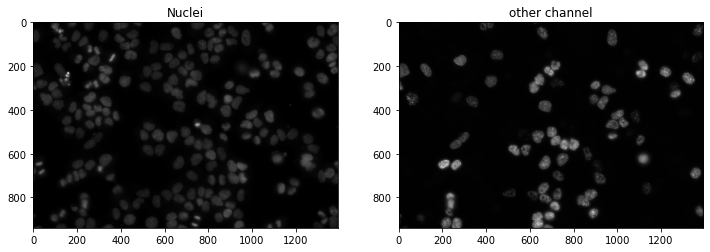

In [79]:
from skimage import measure
from skimage import img_as_float
import matplotlib.image as mpimg

#load another channel
image_2ndChannel = img_as_float(mpimg.imread("../Data/xy040-2.png"))

# extract regionprops using labels_localmax_markers mask from image_2ndChannel
props_other_channel = measure.regionprops(labels_localmax_markers,image_2ndChannel)


plt.figure(figsize=(12,6))
plt.subplot(121)
plt.gca().set_title('Nuclei')
plt.imshow(image_nuclei, cmap='gray')
plt.subplot(122)
plt.gca().set_title('other channel')
plt.imshow(image_2ndChannel, cmap='gray')

### Extract only the intensity related features (others* are features of the mask only)

In [80]:
mean_2nd_channel = [r.mean_intensity for r in props_other_channel]
max_2nd_channel = [r.max_intensity for r in props_other_channel]
min_2nd_channel = [r.min_intensity for r in props_other_channel]

### Add these new features to the pandas dataframe

In [81]:
props_df['mean_intensity_ch2'] = mean_2nd_channel
props_df['max_intensity_ch2'] = max_2nd_channel
props_df['min_intensity_ch2'] = min_2nd_channel

props_df

,area,bbox,bbox_area,centroid,convex_area,eccentricity,equivalent_diameter,euler_number,extent,filled_area,...,min_intensity,minor_axis_length,orientation,perimeter,slice,solidity,weighted_centroid,mean_intensity_ch2,max_intensity_ch2,min_intensity_ch2
0,1034,"(0, 152, 27, 202)",1350,"(11.19439071566731, 176.13056092843325)",1063,0.803082,36.284014,1,0.765926,1034,...,0.002090,28.817252,-1.474824,134.219300,"(slice(0, 27, None), slice(152, 202, None))",0.972719,"(9.471141254673604, 177.62865715399982)",0.000149,0.000397,0.000000
1,737,"(0, 453, 22, 499)",1012,"(8.40841248303935, 477.9036635006784)",748,0.873175,30.632949,1,0.728261,737,...,0.002029,22.075411,1.474012,115.976659,"(slice(0, 22, None), slice(453, 499, None))",0.985294,"(7.391350978747608, 477.89791476736195)",0.000111,0.000336,0.000000
2,150,"(0, 607, 7, 637)",210,"(2.3066666666666666, 621.5066666666667)",156,0.968575,13.819766,1,0.714286,150,...,0.002182,7.167693,-1.565004,62.349242,"(slice(0, 7, None), slice(607, 637, None))",0.961538,"(2.086598938393352, 621.3798371405671)",0.002449,0.004120,0.000824
3,1897,"(0, 720, 36, 785)",2340,"(15.205060622034791, 750.3494992092778)",1917,0.823359,49.146062,1,0.810684,1897,...,0.001968,37.754509,-1.483080,175.154329,"(slice(0, 36, None), slice(720, 785, None))",0.989567,"(14.306770283648738, 750.1989996495538)",0.000127,0.000366,0.000000
4,543,"(0, 1043, 24, 1083)",960,"(7.81767955801105, 1058.9539594843461)",565,0.803292,26.293898,1,0.565625,543,...,0.001862,21.833675,-1.366389,103.083261,"(slice(0, 24, None), slice(1043, 1083, None))",0.961062,"(6.715544892461953, 1059.6790105299453)",0.000121,0.000351,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,315,"(929, 2, 940, 40)",418,"(934.9904761904762, 22.006349206349206)",326,0.956888,20.026744,1,0.753589,315,...,0.002197,11.122592,-1.520283,85.213203,"(slice(929, 940, None), slice(2, 40, None))",0.966258,"(935.2524699935746, 21.978047055834875)",0.000605,0.002686,0.000000
216,825,"(919, 104, 940, 153)",1029,"(930.540606060606, 128.49818181818182)",847,0.897331,32.410224,1,0.801749,825,...,0.002075,22.055891,-1.557020,122.526912,"(slice(919, 940, None), slice(104, 153, None))",0.974026,"(931.3903367610546, 128.1929432883285)",0.000090,0.000351,0.000000
217,693,"(921, 316, 940, 368)",988,"(932.01443001443, 343.3679653679654)",716,0.924588,29.704461,1,0.701417,693,...,0.001877,19.115116,-1.519193,121.597980,"(slice(921, 940, None), slice(316, 368, None))",0.967877,"(932.6920905094222, 343.974384656583)",0.000073,0.000397,0.000000
218,666,"(921, 654, 940, 706)",988,"(932.1351351351351, 678.5525525525526)",685,0.921294,29.120054,1,0.674089,666,...,0.001938,19.090712,1.517528,120.426407,"(slice(921, 940, None), slice(654, 706, None))",0.972263,"(933.0284713165368, 678.5456653777376)",0.003565,0.006348,0.000778


**Sometimes it's easier to see a bimodal distribution in log scale**

(array([ 1., 10., 46., 40., 22., 12.,  5.,  4.,  1.,  4.,  1.,  3.,  3.,
         2., 10.,  7., 15., 15., 14.,  5.]),
 array([-9.80940577, -9.56932974, -9.32925371, -9.08917767, -8.84910164,
        -8.60902561, -8.36894957, -8.12887354, -7.88879751, -7.64872147,
        -7.40864544, -7.16856941, -6.92849338, -6.68841734, -6.44834131,
        -6.20826528, -5.96818924, -5.72811321, -5.48803718, -5.24796114,
        -5.00788511]),
 <BarContainer object of 20 artists>)

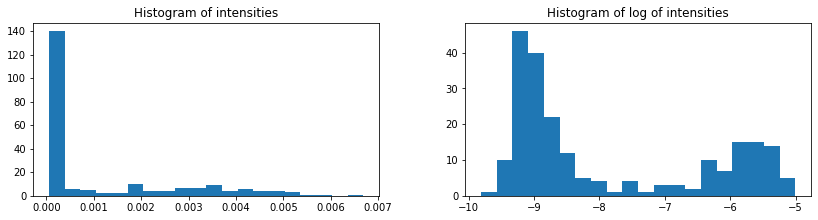

In [82]:
fig = plt.figure(figsize=(12,6))
fig.add_axes([0.1,0.1,0.4,0.4])
plt.gca().set_title('Histogram of intensities')
plt.hist(props_df.mean_intensity_ch2,20)
fig.add_axes([0.6,0.1,0.4,0.4])
plt.gca().set_title('Histogram of log of intensities')

plt.hist(np.log(props_df.mean_intensity_ch2),20)

**We can compare distributions of different channels**

Text(0, 0.5, 'Ch1')

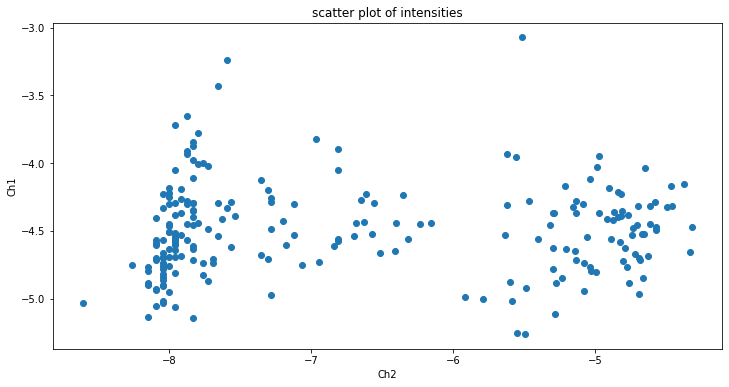

In [83]:
plt.figure(figsize=(12,6))

plt.gca().set_title('scatter plot of intensities')
plt.scatter(np.log(props_df['max_intensity_ch2']), np.log(props_df['max_intensity']))
plt.xlabel('Ch2')
plt.ylabel('Ch1')

### And so, we've successfully implemented a simple image segmentation pipeline for multicolor microscopy data. 

# 4. Intro to tracking
### Sometimes we image the same object at different times. It's useful to have a way to track the object and see how it changes dynamically. 

<img src="./images/procpl_0.png" width="400" height="400" >

### It is usually more efficient to track objects that have been segmented by using the extracted features, rather than the raw image data. As such, this is technically not an image processing, but rather a data analysis method. However, it's a very common task in microscopy experiments. 

### While we won't have time to build a full tracking pipeline, we will try to understand the basics of object tracking. The core building block of a tracking pipeline is a method that matches detected. objects from 2 different timepoints.



**Let's start by creating a small toy dataset. The dataset will have 2 timepoints (before and after). We will  generate random positions for the "before" points. We will then generate random velocities and calculate the "after" points. Our goal is to match "before" points to the correct "after" points:**

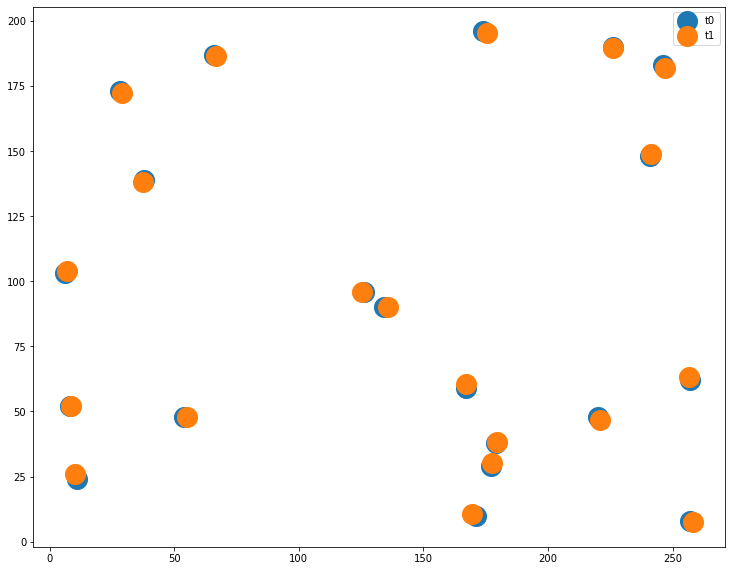

In [84]:
import math
import numpy as np
from numpy import random

#define region of interest
imgx = 300
imgy = 200

#number of objects
n=20

# these are parameters for normal distributions of the velocity. 
# mux/muy correspont to drift velocity and sigmax/sigmay to diffusion.
# We'll start with no drift and minimum diffusion. Easy!
mux=0
muy=0
sigmax=1
sigmay=1

random.seed(12345678)

cxList = random.randint(0, imgx ,size=n) # circle center x
cyList = random.randint(0, imgy ,size=n) # circle center y
vxList = mux+sigmax*random.normal(size=n) # velocity in x
vyList = muy+sigmay*random.normal(size=n) # velocity in y

centroids_t0 = np.column_stack((cxList, cyList))
centroids_t1 = np.column_stack((cxList+vxList, cyList+vyList))

from matplotlib import pyplot as plt
fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.6,0.8,0.5])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])


## 4.1 Nearest neighbor tracking

### This is the simplest thing you could do. For every point, find the nearest neighbor and match them:

<img src="./images/NNMatch1.png" width="600" height="400" >

### Notice that matching 0->1 is not always the same as matching 1->0, so make sure to operate on the right axes:

<img src="./images/NNMatch2.png" width="600" height="400" >




### You could use an efficient method like [KdTree](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.KDTree.html) to calculate the nearest neighbors. In our case we have a small dataset, so we can just calculate directly. We'll use the distance_matrix method from [scipy.spatial](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance_matrix.html#scipy.spatial.distance_matrix) and the function argmin from numpy to find the matrix index where the distance is minimal. Make sure to specify the axis for argmin so it applies line by line.

got 100.0% right


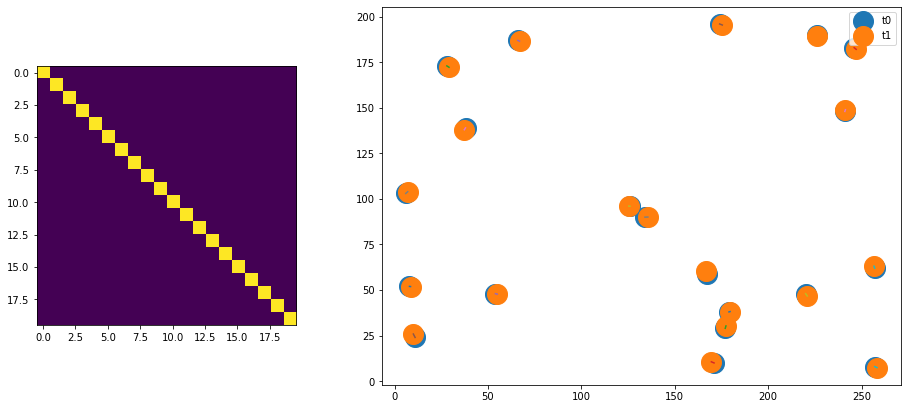

In [85]:
from scipy import spatial
# The centroid positions for the 2 timepoints are stored in the variables centroids_t0 and centroids_t1
# First calculate the distance matrix:
dist_mat = spatial.distance_matrix(centroids_t0, centroids_t1)
correct_match = np.arange(n)

# Then find the matching indices using np.argmin
calculated_match = np.argmin(dist_mat, axis=1)

# Calculate the truth table for presentation
truthT=np.array([calculated_match==c for c in correct_match])

fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.1,0.3,0.5])
plt.imshow(truthT)
ax = fig.add_axes([0.5,0.175,0.6,0.35])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])

ax.plot([centroids_t0[calculated_match,0], centroids_t1[:,0]],[centroids_t0[calculated_match,1], centroids_t1[:,1]] )


print('got ' + str(100*np.trace(truthT)/truthT.shape[0]) +'% right')

## We're great at this! We can go home now! Let's try some more diffusion just for fun:

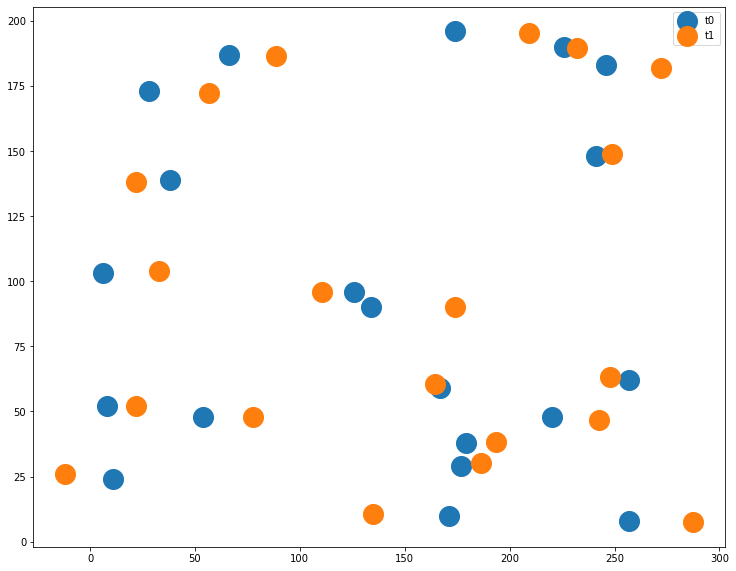

In [86]:
import math
import numpy as np
from numpy import random

#define region of interest
imgx = 300
imgy = 200

#number of objects
n=20

# these are parameters for normal distributions of the velocity. 
# mux/muy correspont to drift velocity and sigmax/sigmay to diffusion.
# Let's add some diffusion
mux=0
muy=0
sigmax=25
sigmay=1

random.seed(12345678)

cxList = random.randint(0, imgx ,size=n) # circle center x
cyList = random.randint(0, imgy ,size=n) # circle center y
vxList = mux+sigmax*random.normal(size=n) # velocity in x
vyList = muy+sigmay*random.normal(size=n) # velocity in y

centroids_t0 = np.column_stack((cxList, cyList))
centroids_t1 = np.column_stack((cxList+vxList, cyList+vyList))

from matplotlib import pyplot as plt
fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.6,0.8,0.5])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])

got 80.0% right


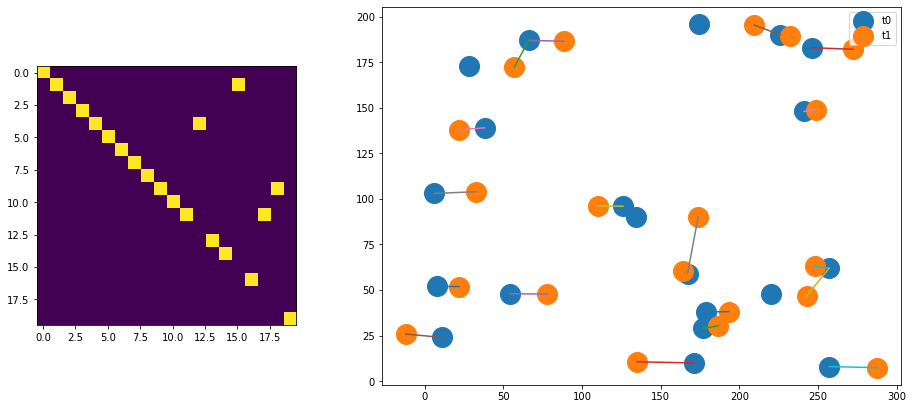

In [87]:
from scipy import spatial
# The centroid positions for the 2 timepoints are stored in the variables centroids_t0 and centroids_t1
# First calculate the distance matrix:
dist_mat = spatial.distance_matrix(centroids_t0, centroids_t1)
correct_match = np.arange(n)

# Then find the matching indices using np.argmin
calculated_match = np.argmin(dist_mat, axis=0)

# Calculate the truth table for presentation
truthT=np.array([calculated_match==c for c in correct_match])

fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.1,0.3,0.5])
plt.imshow(truthT)
ax = fig.add_axes([0.5,0.175,0.6,0.35])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])

ax.plot([centroids_t0[calculated_match,0], centroids_t1[:,0]],[centroids_t0[calculated_match,1], centroids_t1[:,1]] )

print('got ' + str(100*np.trace(truthT)/truthT.shape[0]) +'% right')

## ok, maybe not perfect. Can we do better? What if instead of trying to match every individual object, we instead try and find a global matching that minimizes the TOTAL distance of all connections?

## 4.2 Global optimization using linear assignment.
### Let's look at the following arrangement:
<img src="./images/LAPDemo1.png" width="600" height="400" >

### If we just match nearest neighbors we end up with this:
<img src="./images/lapdemo2.png" width="600" height="400" >

### That's not right. Instead, what if we consider every possible configuration of connections between the points and find the one that minimized the total distance (which we will call the "cost" of a configuration)
### Or in the words of Wikipedia
<img src="./images/LAP_MathFormal.png" width="700" height="150" >

<img src="./images/matchinglap.gif" width="600" height="400" >

### Which in our case will give us:
<img src="./images/lapsol.png" width="600" height="400" >

### There are a few good algorithms that solve the linear assignment problem efficiently. Most famous ones are called the Hungarian Algorithm and the Jonker-Volgenant (JV) algorithm. We will use the JV algorithm which is implemented in [scipy.optimize.linear_sum_assignment](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.linear_sum_assignment.html):

got 100.0% right


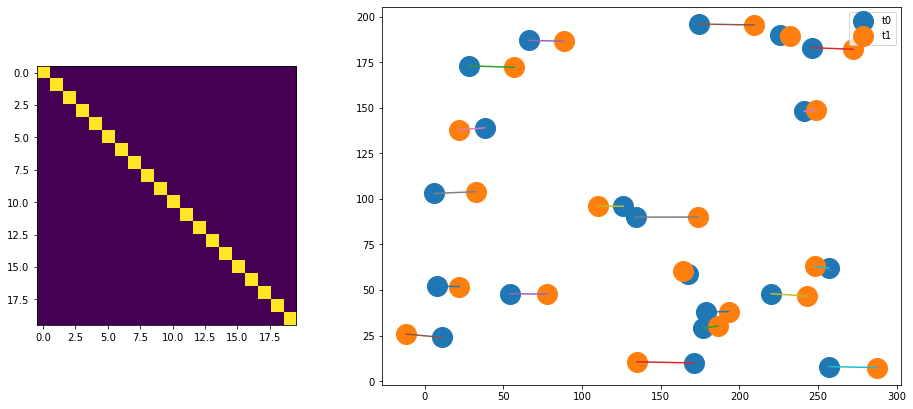

In [88]:
from scipy import optimize
dist_mat = spatial.distance_matrix(centroids_t0, centroids_t1)
cost_mat = dist_mat

#calculate linear assignment using optimize.linear_sum_assignment:
correct_match, calculated_match= optimize.linear_sum_assignment(cost_mat)

truthT=np.array([calculated_match==c for c in correct_match])

fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.1,0.3,0.5])
plt.imshow(truthT)
ax = fig.add_axes([0.5,0.175,0.6,0.35])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])

ax.plot([centroids_t0[calculated_match,0], centroids_t1[:,0]],[centroids_t0[calculated_match,1], centroids_t1[:,1]] )

print('got ' + str(100*np.trace(truthT)/truthT.shape[0]) +'% right')


### Play around with different drift/diffusion parameters and see how they affect performance:

got 100.0% right


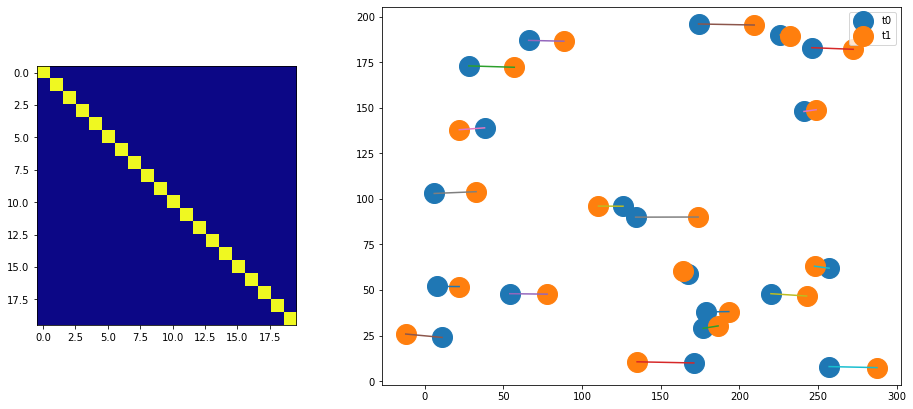

In [98]:
import math
import numpy as np
from numpy import random

#define region of interest
imgx = 300
imgy = 200

#number of objects
n=20

# these are parameters for normal distributions of the velocity. 
# mux/muy correspont to drift velocity and sigmax/sigmay to diffusion.
# Let's add some diffusion
mux=0
muy=0
sigmax=25
sigmay=1

random.seed(12345678)

cxList = random.randint(0, imgx ,size=n) # circle center x
cyList = random.randint(0, imgy ,size=n) # circle center y
vxList = mux+sigmax*random.normal(size=n) # velocity in x
vyList = muy+sigmay*random.normal(size=n) # velocity in y

centroids_t0 = np.column_stack((cxList, cyList))
centroids_t1 = np.column_stack((cxList+vxList, cyList+vyList))

from scipy import optimize
dist_mat = spatial.distance_matrix(centroids_t0, centroids_t1)
cost_mat = dist_mat
correct_match, calculated_match= optimize.linear_sum_assignment(cost_mat)
truthT=np.array([calculated_match==c for c in correct_match])

fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.1,0.3,0.5])
plt.imshow(truthT)
ax = fig.add_axes([0.5,0.175,0.6,0.35])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400)
ax.legend(['t0','t1'])

ax.plot([centroids_t0[calculated_match,0], centroids_t1[:,0]],[centroids_t0[calculated_match,1], centroids_t1[:,1]] )

print('got ' + str(100*np.trace(truthT)/truthT.shape[0]) +'% right')


## 4.3 Using more object features for tracking

### So far we've only looked at the position of an object. In most cases, many other features such as object size, shape, intensity, etc. can be used to improve our tracking results. How can we incorporate other information into our tracking? 

### Let's build a tracking dataset but this time include also an intensity feature. For each object we'll sample an intensity from a lon-normal distribution at the first time point. We'll assume that this intensity comes from a channel that is more or less stable between the timepoints and only add a noise term to get the intensities at the second timepoint:

<Figure size 432x288 with 0 Axes>

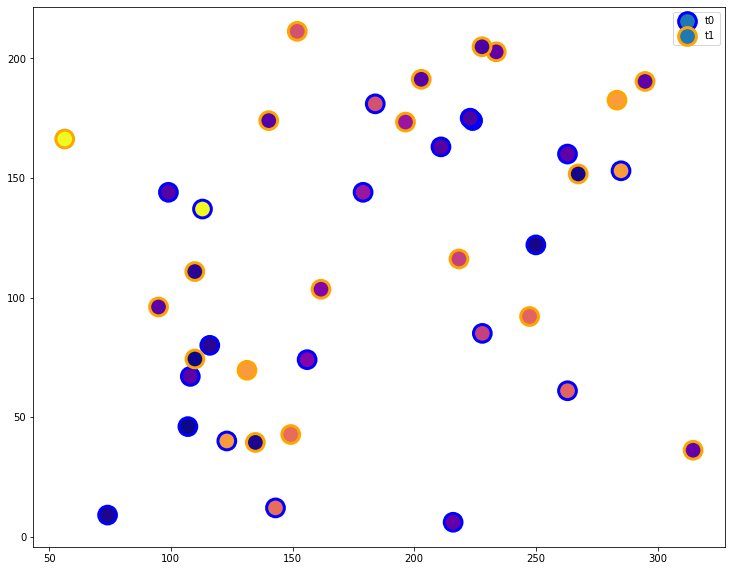

In [110]:
import math
import numpy as np
from numpy import random as random
from PIL import Image, ImageDraw
imgx = 300
imgy = 200
cr = 1
n=20

mux=0
muy=30
sigmax=30
sigmay=1

cxList=[]
cyList=[]
vxList=[]
vyList=[]

iBeforeList = []
iAfterList = []

random.seed(123456789)

cxList = random.randint(0, imgx ,size=n) # circle center x
cyList = random.randint(0, imgy ,size=n) # circle center y
vxList = mux+sigmax*random.normal(size=n) # velocity in x
vyList = muy+sigmay*random.normal(size=n) # velocity in y
iBeforeArray = np.exp(10+3*random.normal(size=n))
iAfterArray = iBeforeArray + random.normal(size=n)


centroids_t0 = np.column_stack((cxList, cyList))
centroids_t1 = np.column_stack((cxList+vxList, cyList+vyList))


from matplotlib import pyplot as plt
plt.set_cmap('plasma')

fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.6,0.8,0.5])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1],s=math.pi*20**2/4, c=np.log(iBeforeArray),edgecolors='blue',linewidths=3)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1],s=math.pi*20**2/4,c=np.log(iAfterArray),edgecolors='orange',linewidths=3)
ax.legend(['t0','t1'])


### The choice of how to incorporate this information into the cost function is up to the user/developer. Different common software do it differently and there is no one right answer. 

got 100.0% right


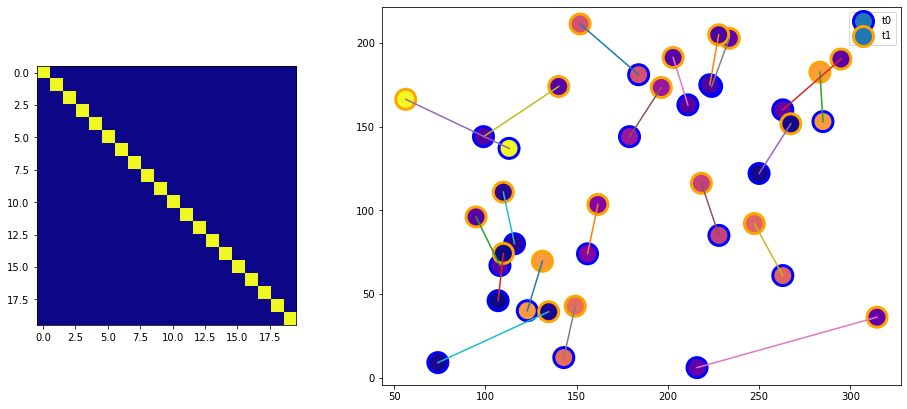

In [113]:
from scipy import optimize
#as before, start with a ditance matrix
dist_mat = spatial.distance_matrix(centroids_t0, centroids_t1)

# This makes it easier to calculate all the combinations 
iBeforeDim = np.expand_dims(iBeforeArray,1)
iAfterDim = np.expand_dims(iAfterArray,1)

#try to implement different terms for using intensity

#intensity_penalty = 1

intensity_penalty = 1+np.abs(np.log10(iBeforeDim/np.transpose(iAfterDim)))

#intensity_penalty = spatial.distance_matrix(iBeforeDim, iAfterDim)

# Make sure you add/multiply your intensity term into the cost
cost_mat = dist_mat*intensity_penalty

correct_match, calculated_match= optimize.linear_sum_assignment(cost_mat)
truthT=np.array([calculated_match==c for c in correct_match])


fig = plt.figure(figsize=(12,15))
ax = fig.add_axes([0.1,0.1,0.3,0.5])
plt.imshow(truthT)
ax = fig.add_axes([0.5,0.175,0.6,0.35])
ax.scatter(centroids_t0[:,0], centroids_t0[:,1], s=400, c=np.log(iBeforeArray),edgecolors='blue',linewidths=3)
ax.scatter(centroids_t1[:,0], centroids_t1[:,1], s=400, c=np.log(iAfterArray),edgecolors='orange',linewidths=3)
ax.legend(['t0','t1'])

ax.plot([centroids_t0[calculated_match,0], centroids_t1[:,0]],[centroids_t0[calculated_match,1], centroids_t1[:,1]] )

print('got ' + str(100*np.trace(truthT)/truthT.shape[0]) +'% right')


### In principal, any feature can be added to your cost function. It is also not sensitive to dimensionality so tracking cells in 3D works the same and is equally efficient. 

Done!